# OHLC Conditional Overfit Analysis

Tests whether the model has overfitted to the OHLC conditional task.
The model is trained with `mask_mode=predict_close`: Open, High, Low are
revealed as context; Close is the prediction target.

Pipeline:
1. Load checkpoint → recover config (columns, seq_len, seed, subset_size, etc.)
2. Reconstruct exactly which CSV windows were used for training (deterministic via seed)
3. Load those ground-truth OHL windows and Close targets
4. Run reverse process conditioned on OHL → generate Close samples
5. Compare generated Close against ground-truth Close:
   - Sample path overlays
   - Marginal distribution (histogram, QQ, ECDF, moments)
   - OHLC constraint satisfaction rate (L ≤ Close ≤ H)
   - Increment distribution and ACF
   - Per-step conditional mean and std

In [4]:
# ── USER INPUTS ───────────────────────────────────────────────────────────────
CHECKPOINT_PATH = "../checkpoints/ohlc_conditional/NO_NO_REPL_CLOS_ep-117_sde-vp_noise-linear_lr-4e-04_COSAN_channels-64_layers-4_nheads-4_diffemb-128_seq-64_stride-64_20260412_221518.pt"
N_SAMPLES_PER_WINDOW = 10    # how many Close paths to generate per OHL context
N_STEPS          = 2000      # reverse SDE steps; None = use model config default
SEED             = 0
CLOSE_IDX        = 3         # index of Close in the feature tensor (O=0,H=1,L=2,C=3)
# ─────────────────────────────────────────────────────────────────────────────

In [5]:
import sys
sys.path.insert(0, "..")

import os
import glob
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
from scipy import stats as scipy_stats
from statsmodels.tsa.stattools import acf

from src.models.model_core import CSDIModel
from src.utils.WIP_processes import Diffusion_Processes

torch.manual_seed(SEED)
np.random.seed(SEED)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

Device: cpu


## 1. Load checkpoint and recover full config

In [6]:
ckpt   = torch.load(CHECKPOINT_PATH, map_location=device)
config = ckpt["config"]

target_dim   = int(config["data"]["target_dim"])
seq_len      = int(config["train"]["seq_len"])
stride       = int(config["train"]["stride"])
seed         = int(config["train"]["seed"])
data_root    = config["train"]["data_root"]          # relative to repo root, e.g. ./data/fake_fts_processed
columns      = tuple(config["data"].get("columns", ("date", "log_adj_close")))
subset_size  = config["train"].get("train_subset_size", None)
subset_ratio = config["train"].get("train_subset_ratio", None)
val_ratio    = config["train"].get("val_split_ratio", None)

# Resolve data_root relative to repo root (one level up from notebooks/)
repo_root  = os.path.abspath("..")
abs_root   = os.path.join(repo_root, data_root.lstrip("./"))

processes = Diffusion_Processes(config["process"])
model = CSDIModel(target_dim=target_dim, config=config, device=device).to(device)
model.load_state_dict(ckpt["model"])
model.eval()

print(f"Checkpoint epoch : {ckpt.get('epoch', '?')}")
print(f"target_dim={target_dim}  seq_len={seq_len}  stride={stride}  seed={seed}")
print(f"columns    : {columns}")
print(f"data_root  : {abs_root}")
print(f"subset_size: {subset_size}  subset_ratio: {subset_ratio}  val_ratio: {val_ratio}")
print(f"SDE: {config['process']['sde_type']}  mask_mode: {config['train'].get('mask_mode')}")

Checkpoint epoch : 116
target_dim=4  seq_len=64  stride=64  seed=42
columns    : ('date', 'open', 'high', 'low', 'close')
data_root  : c:\Users\Lenovo\Documents\SCUOLA\UNI\MASTER\2ANNO\THESIS\Master-Thesis\data/fake_fts_processed_close
subset_size: None  subset_ratio: 1.0  val_ratio: 0.1
SDE: vp  mask_mode: predict_close


c:\Users\Lenovo\anaconda3\envs\thesis\Lib\site-packages\torch\nn\modules\transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


## 2. Reconstruct the exact training windows (deterministic via seed)

Replicates the index-building and permutation logic from `csdi_train_modified.py`
and `SP500WindowDataset.__init__` to find which (file, start_row) pairs were
actually used during training.

In [7]:
# ── Step 1: rebuild the flat dataset index (same as SP500WindowDataset.__init__) ──
date_col = columns[0]   # "date"
files    = sorted(glob.glob(os.path.join(abs_root, "*.csv")))
assert len(files) > 0, f"No CSVs found in {abs_root}"

flat_index = []  # list of (file_idx, start_row)
for fi, fp in enumerate(files):
    T = len(pd.read_csv(fp, usecols=[date_col]))
    max_start = T - seq_len
    if max_start < 0:
        continue
    for s in range(0, max_start + 1, stride):
        flat_index.append((fi, s))

dataset_size = len(flat_index)
print(f"Total dataset windows : {dataset_size}")

# ── Step 2: same permutation as the training script ───────────────────────────
rng_torch   = torch.Generator().manual_seed(seed)
all_indices = torch.randperm(dataset_size, generator=rng_torch).tolist()

# ── Step 3: carve out validation (if any) ─────────────────────────────────────
if val_ratio is not None and 0 < val_ratio < 1:
    val_size   = max(1, int(dataset_size * val_ratio))
    train_pool = all_indices[val_size:]
    print(f"Val windows carved out: {val_size}")
else:
    train_pool = all_indices

# ── Step 4: subset selection ──────────────────────────────────────────────────
if subset_size is not None:
    n_train = min(int(subset_size), len(train_pool))
elif subset_ratio is not None:
    n_train = max(1, int(dataset_size * subset_ratio))
    n_train = min(n_train, len(train_pool))
else:
    n_train = len(train_pool)

train_indices = train_pool[:n_train]

print(f"Training windows used : {n_train}")
print()
for rank, idx in enumerate(train_indices):
    fi, start = flat_index[idx]
    print(f"  [{rank:2d}] dataset_idx={idx:6d}  file={os.path.basename(files[fi])}  window_start={start}")

Total dataset windows : 31200
Val windows carved out: 3120
Training windows used : 28080

  [ 0] dataset_idx= 15823  file=FAKE_0406.csv  window_start=1792
  [ 1] dataset_idx= 10792  file=FAKE_0277.csv  window_start=1792
  [ 2] dataset_idx=  4269  file=FAKE_0110.csv  window_start=1152
  [ 3] dataset_idx= 10867  file=FAKE_0279.csv  window_start=1600
  [ 4] dataset_idx=  4128  file=FAKE_0106.csv  window_start=2112
  [ 5] dataset_idx= 25421  file=FAKE_0652.csv  window_start=2048
  [ 6] dataset_idx=  2912  file=FAKE_0075.csv  window_start=1664
  [ 7] dataset_idx= 12254  file=FAKE_0315.csv  window_start=512
  [ 8] dataset_idx= 18938  file=FAKE_0486.csv  window_start=1472
  [ 9] dataset_idx= 26260  file=FAKE_0674.csv  window_start=832
  [10] dataset_idx= 26627  file=FAKE_0683.csv  window_start=1856
  [11] dataset_idx=  1247  file=FAKE_0032.csv  window_start=2432
  [12] dataset_idx= 18037  file=FAKE_0463.csv  window_start=1216
  [13] dataset_idx= 24099  file=FAKE_0618.csv  window_start=2304
  

## 3. Load the ground-truth OHLC windows

In [8]:
feat_cols = list(columns[1:])   # ["open", "high", "low", "close"]
K         = len(feat_cols)      # = target_dim = 4

gt_windows = []   # list of (K, seq_len) arrays

for idx in train_indices:
    fi, start = flat_index[idx]
    fp  = files[fi]
    df  = pd.read_csv(fp)
    win = df[feat_cols].to_numpy(dtype=np.float32)[start : start + seq_len]  # (seq_len, K)
    gt_windows.append(win.T)   # (K, seq_len)

gt_windows = np.stack(gt_windows)   # (n_train, K, seq_len)
print(f"gt_windows shape: {gt_windows.shape}   (n_windows, K, seq_len)")

# Split into OHL context and Close target
gt_open  = gt_windows[:, 0, :]   # (n_train, seq_len)
gt_high  = gt_windows[:, 1, :]   # (n_train, seq_len)
gt_low   = gt_windows[:, 2, :]   # (n_train, seq_len)
gt_close = gt_windows[:, 3, :]   # (n_train, seq_len)

print(f"Close — mean={gt_close.mean():.4f}  std={gt_close.std():.4f}  "
      f"min={gt_close.min():.4f}  max={gt_close.max():.4f}")

gt_windows shape: (28080, 4, 64)   (n_windows, K, seq_len)
Close — mean=-0.0000  std=1.0000  min=-4.1852  max=4.6832


## 4. Run reverse process conditioned on OHL

For each training window we feed the OHL channels as observed context
(cond_mask = 1 for O,H,L; 0 for Close) and sample `N_SAMPLES_PER_WINDOW`
independent Close paths.

This is our SDE: <src.utils.WIP_SDE.VPSDE object at 0x0000020F8EB96FC0>
This is the value of T: 1.0
Check prior vp: Mean = 0.00456831231713295, Std = 1.0065313577651978
[step    1/2000 | t=1.0000]  mean=0.0083  std=1.0116  min=-3.5576  max=4.2660  dx_norm=2.25e-04
  skew=0.1241  kurt(excess)=0.2787
  per-feat std: k0=1.052  k1=0.968  k2=1.028  k3=0.997
  elapsed 0.2s



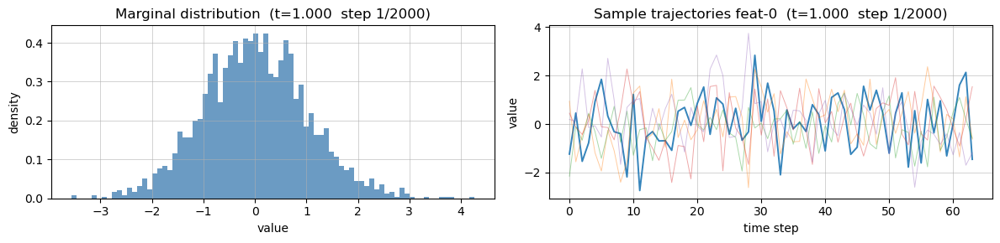

[step  201/2000 | t=0.9001]  mean=2.4494  std=8.3305  min=-27.5317  max=37.1354  dx_norm=3.07e-03
  skew=0.2768  kurt(excess)=0.7689
  per-feat std: k0=9.442  k1=9.383  k2=9.526  k3=1.007
  elapsed 10.2s



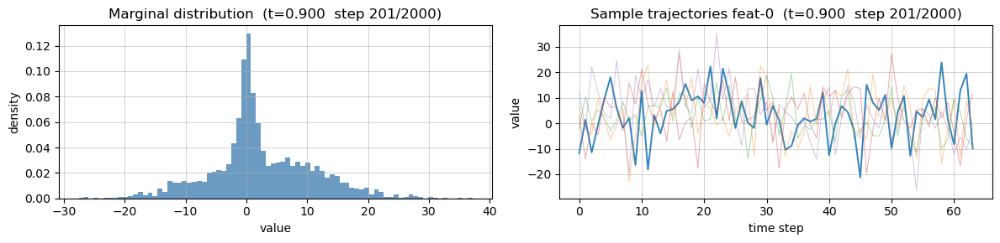

[step  401/2000 | t=0.8001]  mean=14.8137  std=45.8999  min=-151.6607  max=197.2068  dx_norm=8.02e-03
  skew=0.3071  kurt(excess)=0.7300
  per-feat std: k0=52.078  k1=51.403  k2=52.298  k3=1.034
  elapsed 10.5s



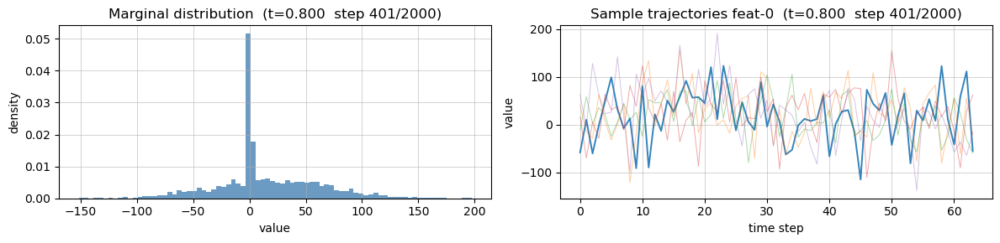

[step  601/2000 | t=0.7002]  mean=67.5384  std=205.4446  min=-673.1954  max=885.9437  dx_norm=2.99e-02
  skew=0.3152  kurt(excess)=0.7218
  per-feat std: k0=232.920  k1=230.033  k2=233.731  k3=0.977
  elapsed 10.2s



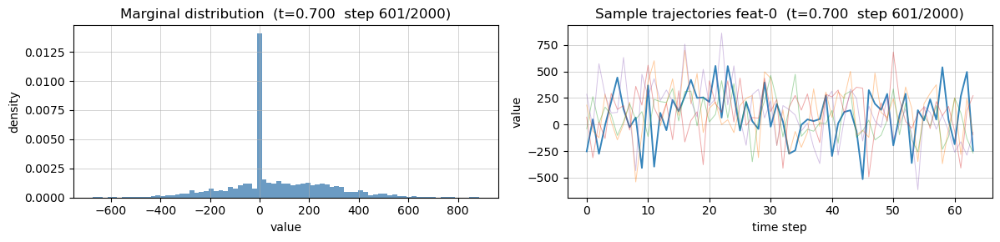

[step  801/2000 | t=0.6002]  mean=248.8078  std=753.4451  min=-2465.4062  max=3248.1409  dx_norm=9.39e-02
  skew=0.3171  kurt(excess)=0.7206
  per-feat std: k0=854.147  k1=843.539  k2=856.817  k3=1.006
  elapsed 10.5s



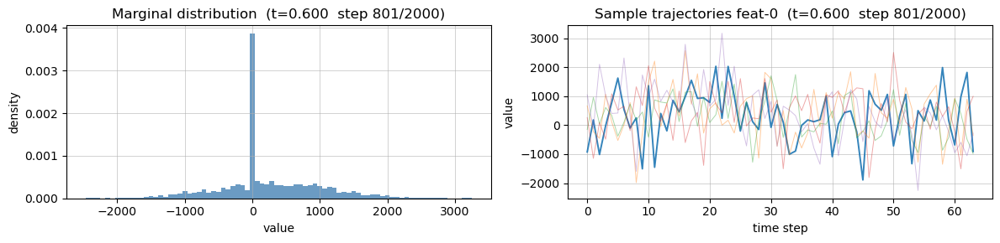

[step 1001/2000 | t=0.5003]  mean=749.4551  std=2266.9016  min=-7406.0679  max=9769.8057  dx_norm=2.36e-01
  skew=0.3174  kurt(excess)=0.7193
  per-feat std: k0=2569.809  k1=2537.655  k2=2577.886  k3=0.980
  elapsed 10.4s



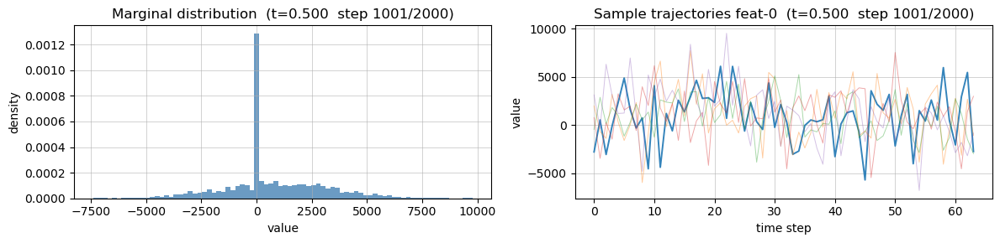

[step 1201/2000 | t=0.4003]  mean=1850.5872  std=5595.2705  min=-18276.5938  max=24114.9805  dx_norm=4.68e-01
  skew=0.3175  kurt(excess)=0.7191
  per-feat std: k0=6342.843  k1=6263.413  k2=6362.739  k3=1.022
  elapsed 10.3s



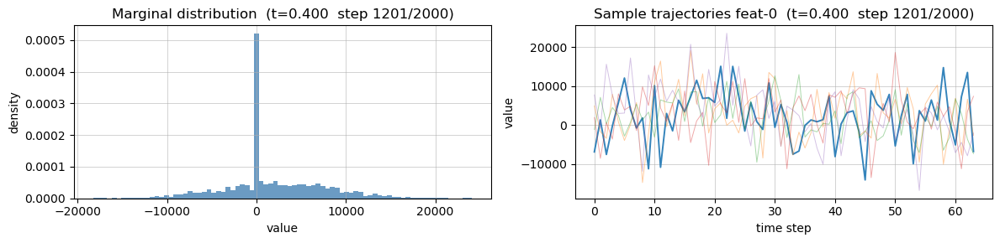

[step 1401/2000 | t=0.3004]  mean=3747.4304  std=11328.5303  min=-37001.0469  max=48824.2734  dx_norm=7.14e-01
  skew=0.3175  kurt(excess)=0.7190
  per-feat std: k0=12842.165  k1=12681.054  k2=12882.295  k3=1.074
  elapsed 10.4s



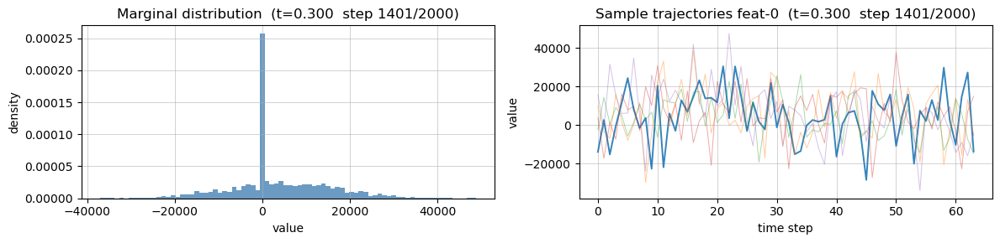

[step 1601/2000 | t=0.2004]  mean=6222.9038  std=18810.5879  min=-61436.6055  max=81070.8672  dx_norm=7.99e-01
  skew=0.3175  kurt(excess)=0.7190
  per-feat std: k0=21323.904  k1=21056.160  k2=21390.611  k3=1.057
  elapsed 10.2s



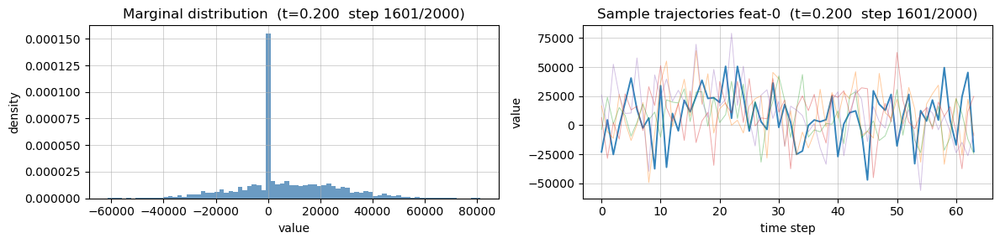

[step 1801/2000 | t=0.1005]  mean=8472.8848  std=25611.0000  min=-83645.4297  max=110378.8125  dx_norm=5.59e-01
  skew=0.3175  kurt(excess)=0.7190
  per-feat std: k0=29032.906  k1=28668.207  k2=29123.797  k3=1.018
  elapsed 10.1s



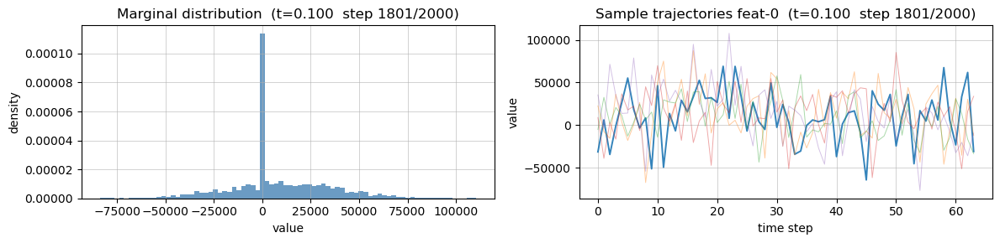

[step 1992/2000 | t=0.0050]  mean=9451.0996  std=28567.1270  min=-93299.0859  max=123118.2031  dx_norm=5.93e-02
  skew=0.3175  kurt(excess)=0.7190
  per-feat std: k0=32384.002  k1=31977.117  k2=32485.367  k3=0.998
  elapsed 9.8s

[step 1993/2000 | t=0.0045]  mean=9451.9961  std=28569.8320  min=-93307.9219  max=123129.8828  dx_norm=5.63e-02
  skew=0.3175  kurt(excess)=0.7190
  per-feat std: k0=32387.070  k1=31980.146  k2=32488.445  k3=0.997
  elapsed 0.1s

[step 1994/2000 | t=0.0040]  mean=9452.8447  std=28572.3984  min=-93316.2969  max=123140.9297  dx_norm=5.34e-02
  skew=0.3175  kurt(excess)=0.7190
  per-feat std: k0=32389.977  k1=31983.016  k2=32491.363  k3=0.997
  elapsed 0.0s

[step 1995/2000 | t=0.0035]  mean=9453.6475  std=28574.8203  min=-93324.2344  max=123151.3594  dx_norm=5.04e-02
  skew=0.3175  kurt(excess)=0.7190
  per-feat std: k0=32392.725  k1=31985.729  k2=32494.119  k3=0.997
  elapsed 0.0s

[step 1996/2000 | t=0.0030]  mean=9454.4043  std=28577.1016  min=-93331.6875  ma

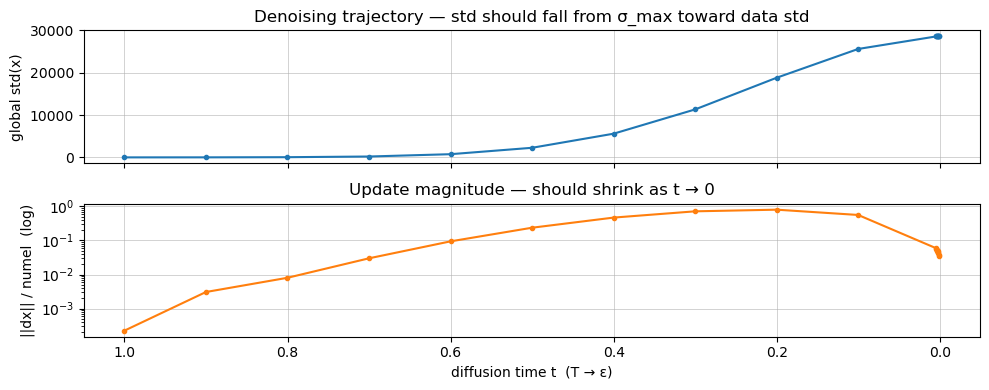

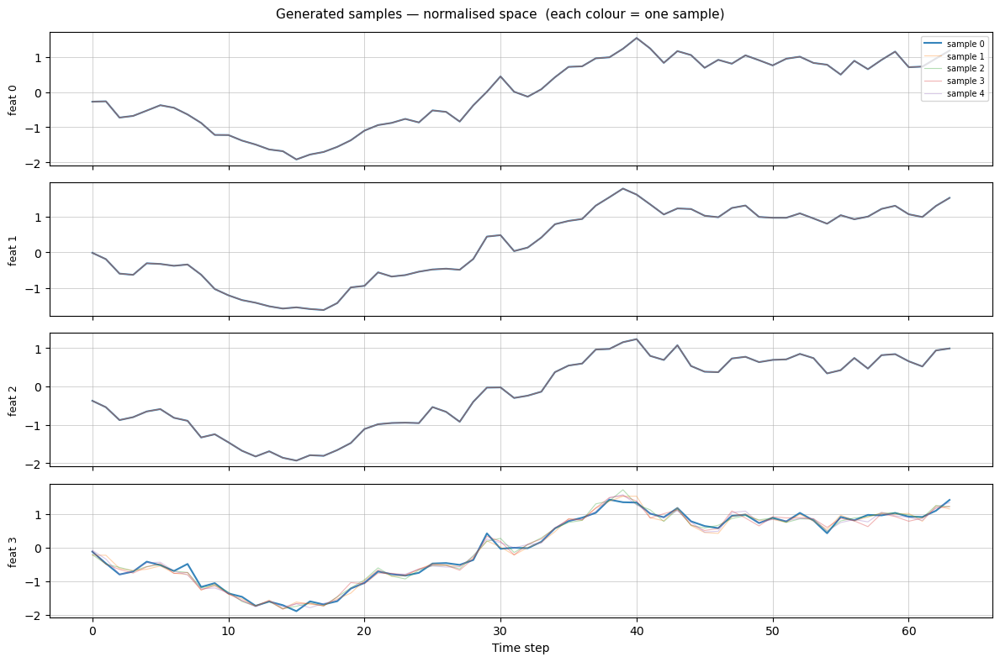

This is our SDE: <src.utils.WIP_SDE.VPSDE object at 0x0000020F8EB96FC0>
This is the value of T: 1.0
Check prior vp: Mean = -3.503821744743618e-06, Std = 1.0086901187896729
[step    1/2000 | t=1.0000]  mean=0.0032  std=1.0131  min=-4.0247  max=4.6606  dx_norm=2.22e-04
  skew=0.0233  kurt(excess)=0.3113
  per-feat std: k0=0.988  k1=0.957  k2=1.042  k3=1.061
  elapsed 0.1s



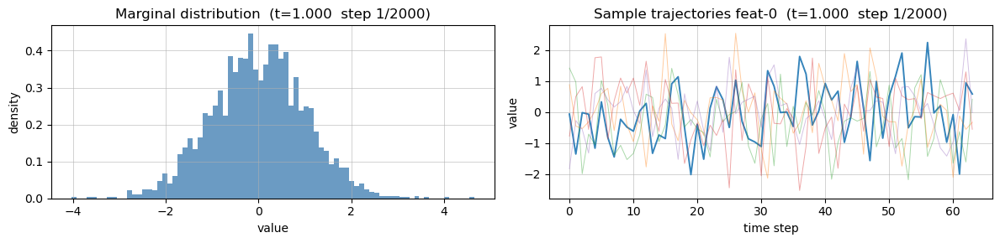

[step  201/2000 | t=0.9001]  mean=2.0443  std=8.2724  min=-28.0281  max=37.6911  dx_norm=3.06e-03
  skew=0.2649  kurt(excess)=1.0631
  per-feat std: k0=9.305  k1=9.325  k2=9.600  k3=0.956
  elapsed 10.1s



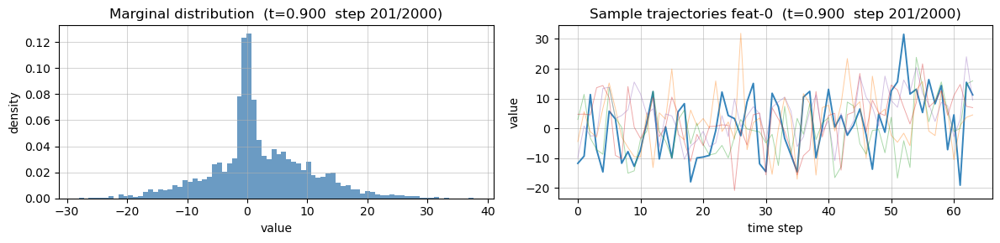

[step  401/2000 | t=0.8001]  mean=12.6539  std=45.5085  min=-150.3436  max=197.8007  dx_norm=7.87e-03
  skew=0.3076  kurt(excess)=1.0650
  per-feat std: k0=51.617  k1=51.224  k2=52.178  k3=0.991
  elapsed 10.1s



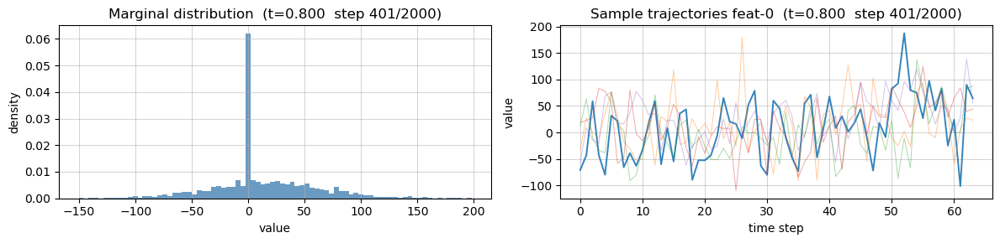

[step  601/2000 | t=0.7002]  mean=57.9446  std=203.6213  min=-665.0648  max=887.0613  dx_norm=2.92e-02
  skew=0.3161  kurt(excess)=1.0508
  per-feat std: k0=231.137  k1=229.087  k2=232.914  k3=1.018
  elapsed 10.5s



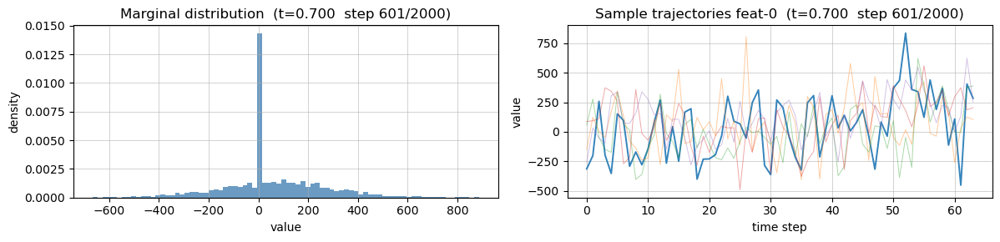

[step  801/2000 | t=0.6002]  mean=213.4352  std=746.6762  min=-2436.7839  max=3248.9321  dx_norm=9.19e-02
  skew=0.3176  kurt(excess)=1.0481
  per-feat std: k0=847.637  k1=839.780  k2=853.909  k3=1.021
  elapsed 10.3s



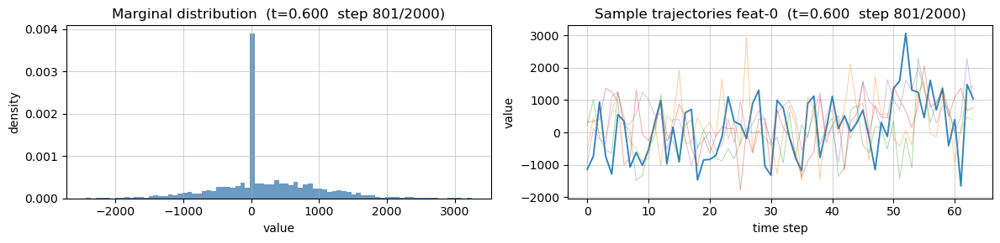

[step 1001/2000 | t=0.5003]  mean=643.0268  std=2246.3772  min=-7328.3413  max=9773.5146  dx_norm=2.31e-01
  skew=0.3178  kurt(excess)=1.0477
  per-feat std: k0=2550.051  k1=2526.183  k2=2569.046  k3=0.982
  elapsed 10.1s



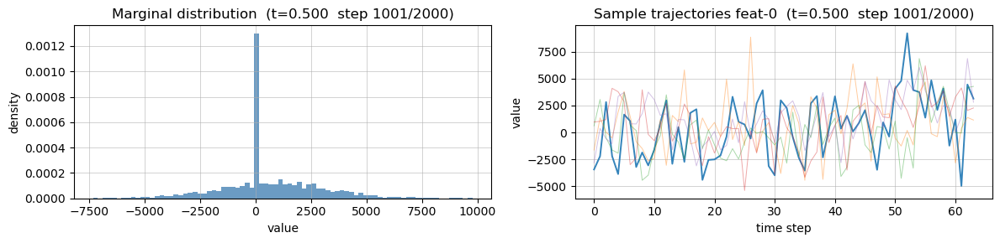

[step 1201/2000 | t=0.4003]  mean=1587.8619  std=5544.5610  min=-18086.2598  max=24125.1465  dx_norm=4.58e-01
  skew=0.3179  kurt(excess)=1.0474
  per-feat std: k0=6293.940  k1=6235.067  k2=6340.970  k3=1.065
  elapsed 10.2s



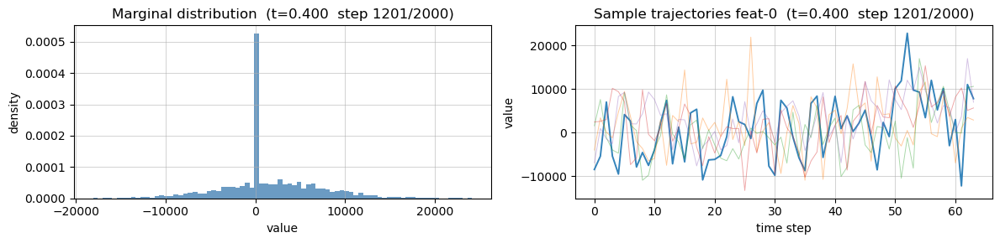

[step 1401/2000 | t=0.3004]  mean=3215.3704  std=11225.8379  min=-36618.4883  max=48845.2539  dx_norm=6.99e-01
  skew=0.3180  kurt(excess)=1.0473
  per-feat std: k0=12743.095  k1=12623.697  k2=12838.226  k3=1.051
  elapsed 10.1s



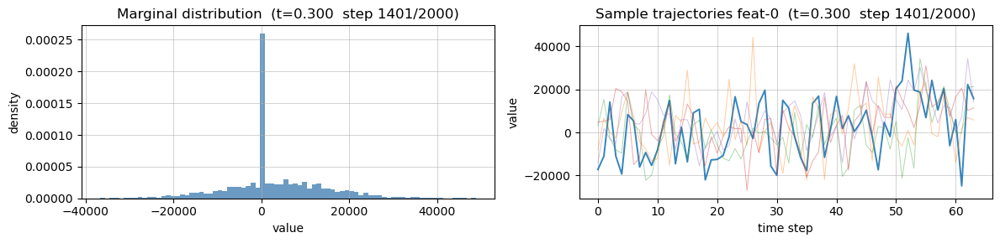

[step 1601/2000 | t=0.2004]  mean=5339.4355  std=18640.1387  min=-60805.1016  max=81107.6328  dx_norm=7.82e-01
  skew=0.3180  kurt(excess)=1.0473
  per-feat std: k0=21159.432  k1=20961.135  k2=21317.453  k3=1.045
  elapsed 10.5s



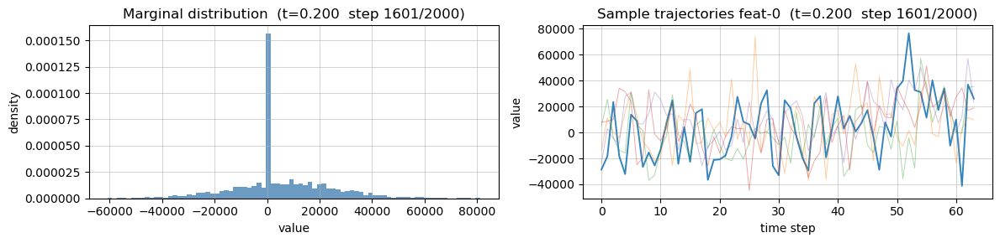

[step 1801/2000 | t=0.1005]  mean=7270.0029  std=25378.9492  min=-82786.7344  max=110430.3125  dx_norm=5.47e-01
  skew=0.3180  kurt(excess)=1.0473
  per-feat std: k0=28808.965  k1=28538.949  k2=29024.193  k3=1.022
  elapsed 10.8s



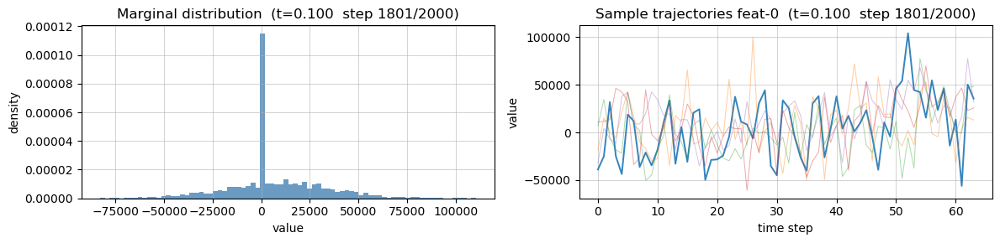

[step 1992/2000 | t=0.0050]  mean=8109.2969  std=28308.3125  min=-92342.0703  max=123175.8125  dx_norm=5.80e-02
  skew=0.3180  kurt(excess)=1.0472
  per-feat std: k0=32134.186  k1=31832.949  k2=32374.357  k3=0.998
  elapsed 9.8s

[step 1993/2000 | t=0.0045]  mean=8110.0664  std=28310.9941  min=-92350.8125  max=123187.4844  dx_norm=5.51e-02
  skew=0.3180  kurt(excess)=1.0472
  per-feat std: k0=32137.230  k1=31835.965  k2=32377.426  k3=0.997
  elapsed 0.1s

[step 1994/2000 | t=0.0040]  mean=8110.7954  std=28313.5371  min=-92359.0938  max=123198.5469  dx_norm=5.23e-02
  skew=0.3180  kurt(excess)=1.0472
  per-feat std: k0=32140.115  k1=31838.822  k2=32380.332  k3=0.997
  elapsed 0.0s

[step 1995/2000 | t=0.0035]  mean=8111.4834  std=28315.9375  min=-92366.9297  max=123209.0234  dx_norm=4.94e-02
  skew=0.3180  kurt(excess)=1.0472
  per-feat std: k0=32142.842  k1=31841.521  k2=32383.078  k3=0.997
  elapsed 0.0s

[step 1996/2000 | t=0.0030]  mean=8112.1318  std=28318.1992  min=-92374.3047  ma

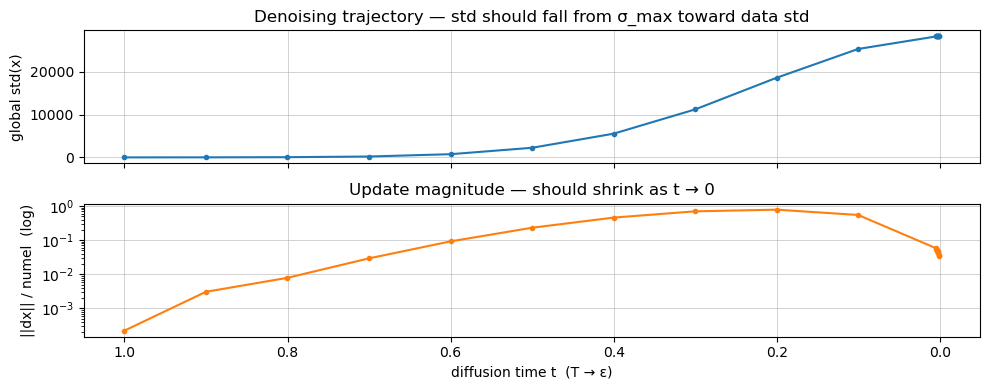

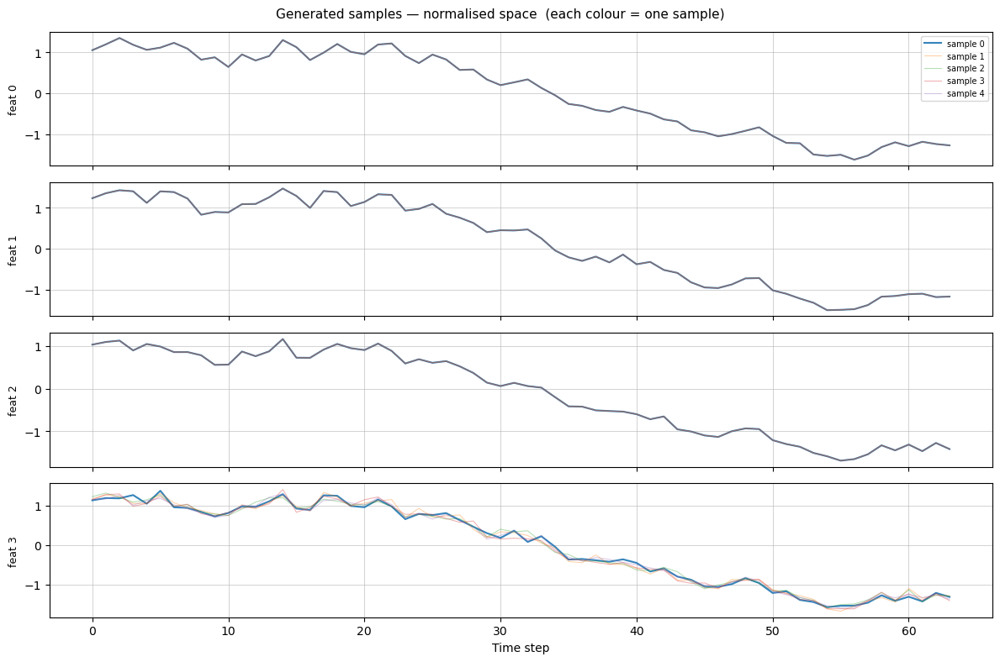

This is our SDE: <src.utils.WIP_SDE.VPSDE object at 0x0000020F8EB96FC0>
This is the value of T: 1.0
Check prior vp: Mean = -0.020904265344142914, Std = 0.9816777110099792
[step    1/2000 | t=1.0000]  mean=-0.0173  std=0.9866  min=-3.3610  max=3.2718  dx_norm=2.21e-04
  skew=0.0376  kurt(excess)=-0.1345
  per-feat std: k0=0.970  k1=0.966  k2=1.032  k3=0.978
  elapsed 0.1s



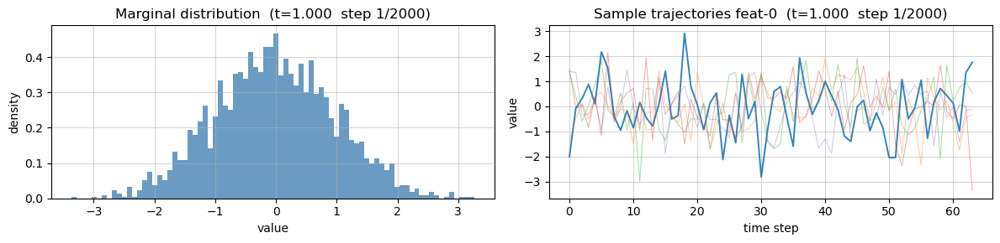

[step  201/2000 | t=0.9001]  mean=2.0487  std=8.2207  min=-24.7796  max=31.3613  dx_norm=3.08e-03
  skew=0.3219  kurt(excess)=0.7431
  per-feat std: k0=9.567  k1=9.332  k2=9.153  k3=0.990
  elapsed 10.8s



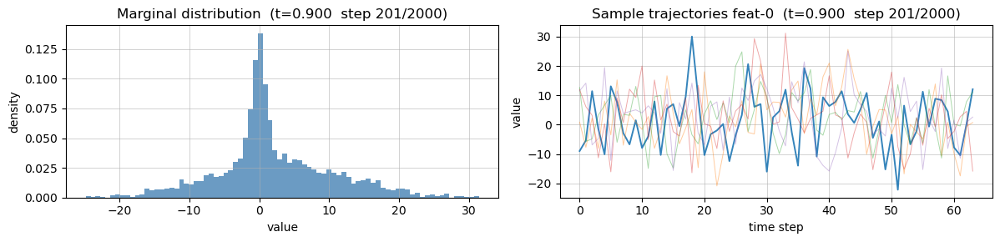

[step  401/2000 | t=0.8001]  mean=12.8766  std=45.0634  min=-129.6268  max=175.5210  dx_norm=7.87e-03
  skew=0.3609  kurt(excess)=0.7329
  per-feat std: k0=52.728  k1=50.931  k2=49.750  k3=0.995
  elapsed 11.8s



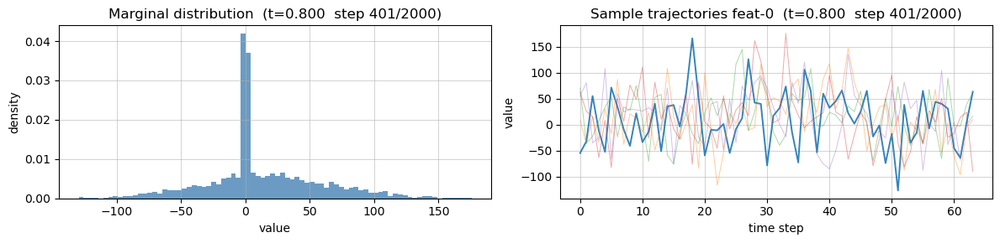

[step  601/2000 | t=0.7002]  mean=58.8599  std=201.7942  min=-581.7103  max=785.2053  dx_norm=2.91e-02
  skew=0.3660  kurt(excess)=0.7295
  per-feat std: k0=236.204  k1=227.776  k2=222.505  k3=0.964
  elapsed 11.6s



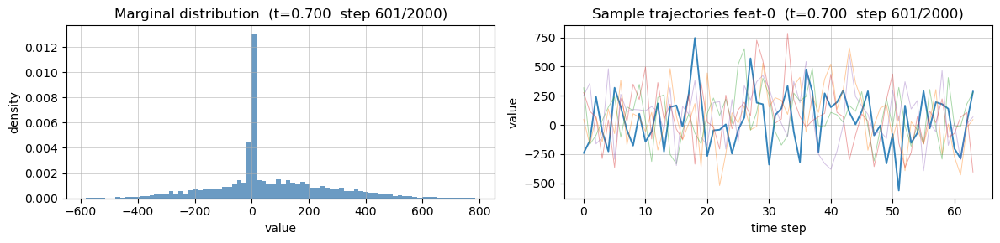

[step  801/2000 | t=0.6002]  mean=217.0298  std=740.0842  min=-2138.1086  max=2880.2334  dx_norm=9.12e-02
  skew=0.3671  kurt(excess)=0.7281
  per-feat std: k0=866.137  k1=835.249  k2=815.837  k3=0.980
  elapsed 11.7s



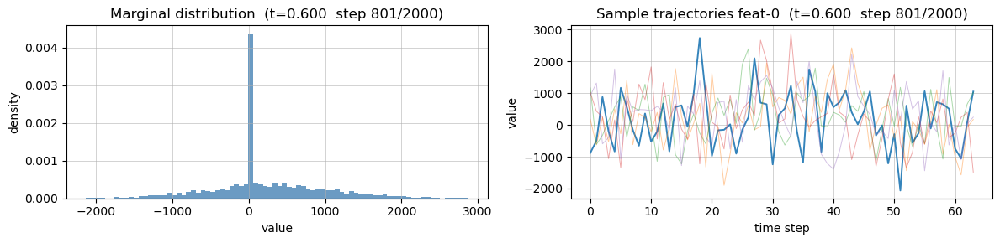

[step 1001/2000 | t=0.5003]  mean=653.7893  std=2226.6250  min=-6428.4844  max=8662.4971  dx_norm=2.29e-01
  skew=0.3673  kurt(excess)=0.7274
  per-feat std: k0=2606.042  k1=2512.713  k2=2454.244  k3=0.996
  elapsed 10.2s



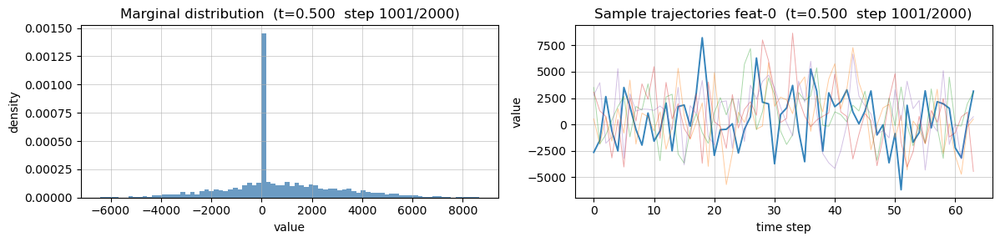

[step 1201/2000 | t=0.4003]  mean=1614.3844  std=5495.9346  min=-15860.9443  max=21383.0898  dx_norm=4.55e-01
  skew=0.3675  kurt(excess)=0.7273
  per-feat std: k0=6432.359  k1=6201.979  k2=6057.651  k3=1.059
  elapsed 11.9s



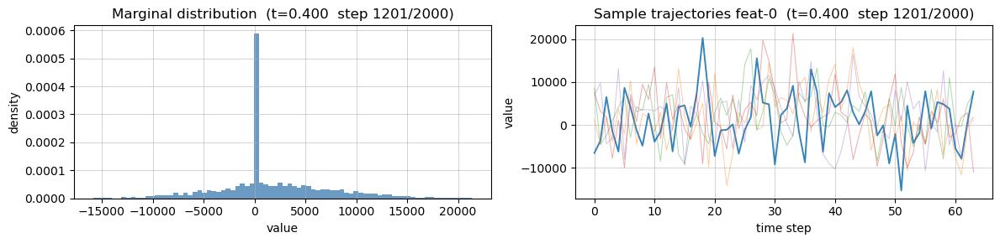

[step 1401/2000 | t=0.3004]  mean=3269.1245  std=11127.4043  min=-32113.3691  max=43291.8828  dx_norm=6.94e-01
  skew=0.3676  kurt(excess)=0.7274
  per-feat std: k0=13023.305  k1=12556.809  k2=12264.625  k3=1.069
  elapsed 15.8s



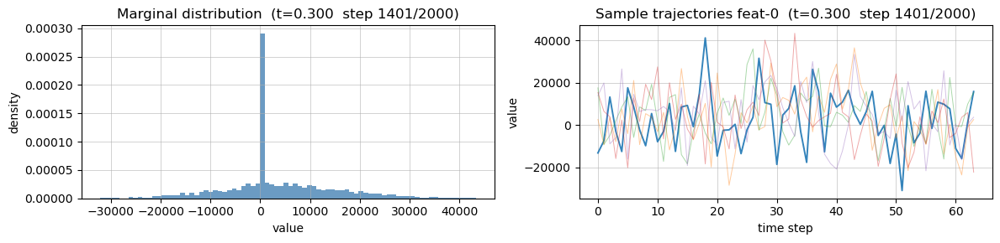

[step 1601/2000 | t=0.2004]  mean=5428.6533  std=18476.7188  min=-53320.9883  max=71882.2812  dx_norm=7.76e-01
  skew=0.3676  kurt(excess)=0.7273
  per-feat std: k0=21624.705  k1=20850.178  k2=20364.988  k3=1.076
  elapsed 14.0s



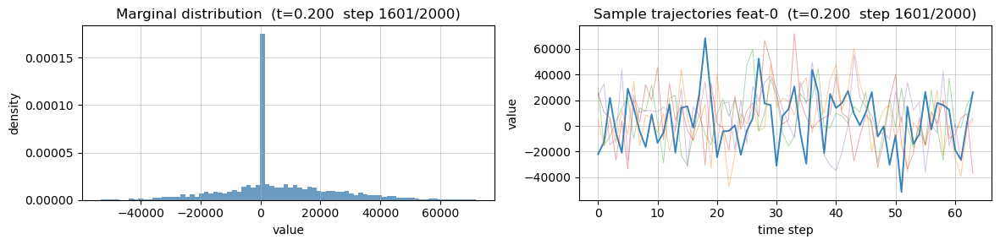

[step 1801/2000 | t=0.1005]  mean=7391.4600  std=25156.4062  min=-72597.3281  max=97868.7188  dx_norm=5.43e-01
  skew=0.3676  kurt(excess)=0.7273
  per-feat std: k0=29442.410  k1=28387.855  k2=27727.314  k3=1.024
  elapsed 12.8s



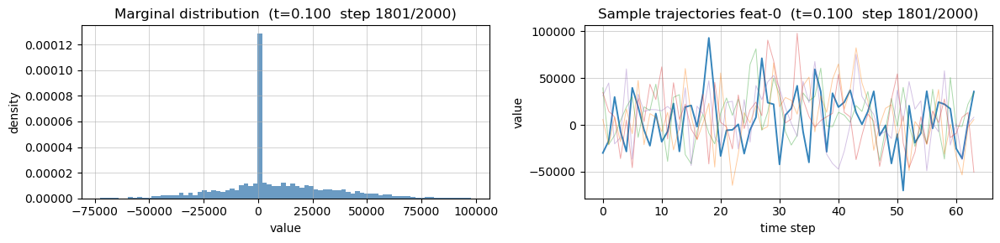

[step 1992/2000 | t=0.0050]  mean=8244.7725  std=28060.0566  min=-80975.7188  max=109163.9688  dx_norm=5.76e-02
  skew=0.3676  kurt(excess)=0.7273
  per-feat std: k0=32840.711  k1=31664.453  k2=30927.715  k3=1.010
  elapsed 10.8s

[step 1993/2000 | t=0.0045]  mean=8245.5547  std=28062.7148  min=-80983.3906  max=109174.2969  dx_norm=5.48e-02
  skew=0.3676  kurt(excess)=0.7273
  per-feat std: k0=32843.820  k1=31667.453  k2=30930.646  k3=1.010
  elapsed 0.1s

[step 1994/2000 | t=0.0040]  mean=8246.2949  std=28065.2344  min=-80990.6641  max=109184.0859  dx_norm=5.19e-02
  skew=0.3676  kurt(excess)=0.7273
  per-feat std: k0=32846.770  k1=31670.293  k2=30933.422  k3=1.010
  elapsed 0.1s

[step 1995/2000 | t=0.0035]  mean=8246.9951  std=28067.6133  min=-80997.5469  max=109193.3438  dx_norm=4.90e-02
  skew=0.3676  kurt(excess)=0.7273
  per-feat std: k0=32849.555  k1=31672.979  k2=30936.047  k3=1.010
  elapsed 0.0s

[step 1996/2000 | t=0.0030]  mean=8247.6543  std=28069.8535  min=-81004.0312  m

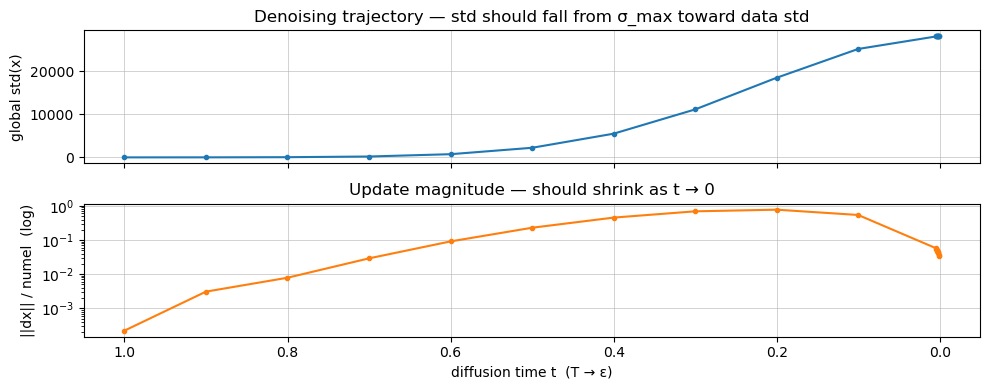

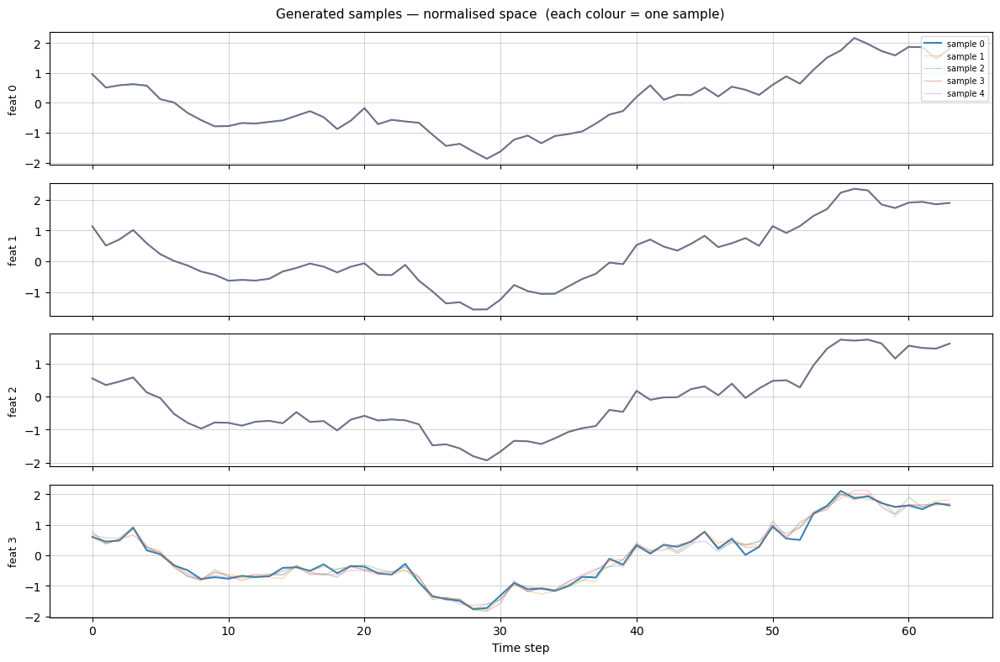

This is our SDE: <src.utils.WIP_SDE.VPSDE object at 0x0000020F8EB96FC0>
This is the value of T: 1.0
Check prior vp: Mean = 0.0018449537456035614, Std = 0.9946334958076477
[step    1/2000 | t=1.0000]  mean=0.0055  std=0.9997  min=-3.5056  max=3.9055  dx_norm=2.25e-04
  skew=0.0148  kurt(excess)=-0.0106
  per-feat std: k0=0.995  k1=1.029  k2=1.006  k3=0.969
  elapsed 0.2s



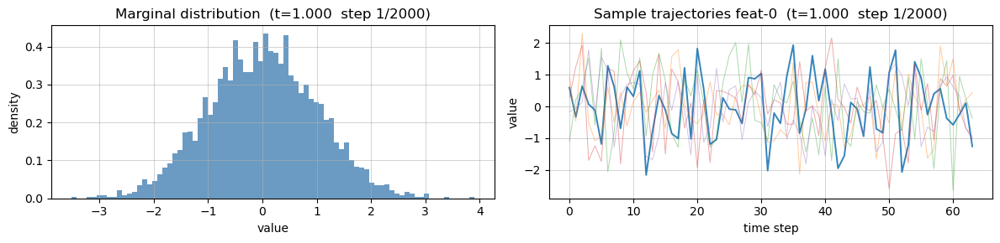

[step  201/2000 | t=0.9001]  mean=2.1161  std=8.5817  min=-35.1506  max=36.0917  dx_norm=3.16e-03
  skew=0.3187  kurt(excess)=0.7444
  per-feat std: k0=10.108  k1=9.714  k2=9.526  k3=1.014
  elapsed 11.0s



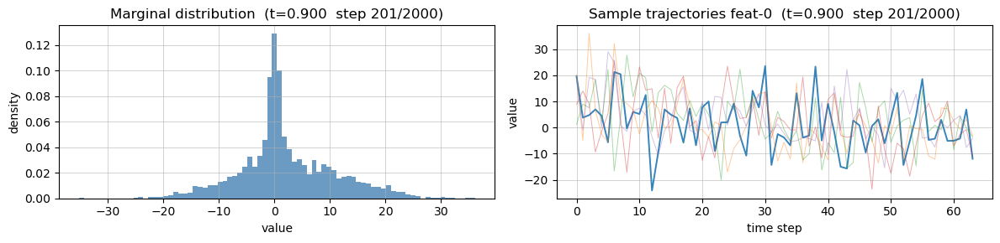

[step  401/2000 | t=0.8001]  mean=13.3542  std=47.3161  min=-185.3150  max=204.1028  dx_norm=8.12e-03
  skew=0.3504  kurt(excess)=0.7039
  per-feat std: k0=55.883  k1=53.074  k2=52.459  k3=1.038
  elapsed 11.2s



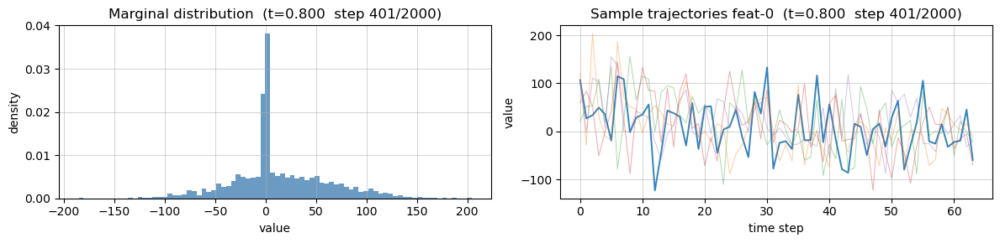

[step  601/2000 | t=0.7002]  mean=61.0224  std=211.7451  min=-823.0419  max=916.7021  dx_norm=3.05e-02
  skew=0.3536  kurt(excess)=0.6968
  per-feat std: k0=249.951  k1=237.365  k2=234.673  k3=0.972
  elapsed 10.5s



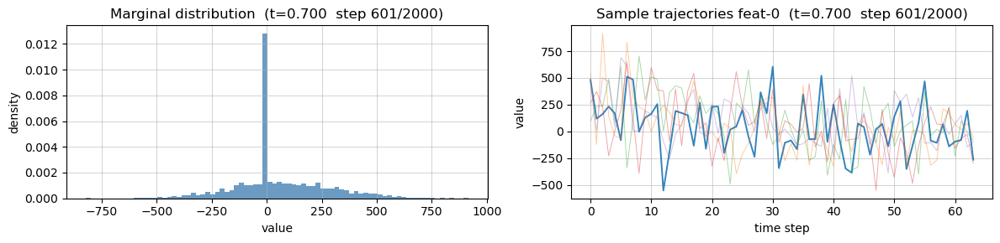

[step  801/2000 | t=0.6002]  mean=224.8596  std=776.5779  min=-3010.6807  max=3360.8298  dx_norm=9.57e-02
  skew=0.3544  kurt(excess)=0.6971
  per-feat std: k0=916.766  k1=870.663  k2=860.031  k3=0.998
  elapsed 10.1s



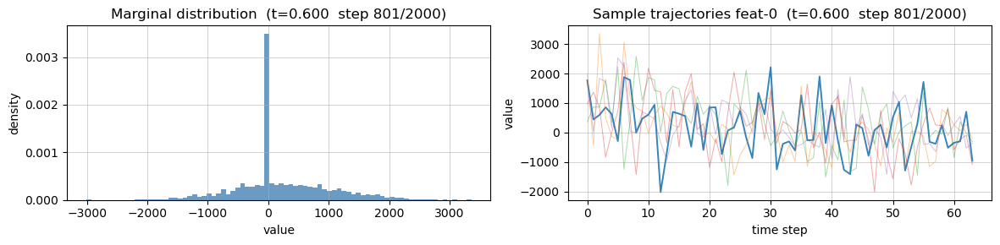

[step 1001/2000 | t=0.5003]  mean=677.5048  std=2336.4399  min=-9060.8896  max=10116.2666  dx_norm=2.40e-01
  skew=0.3547  kurt(excess)=0.6968
  per-feat std: k0=2758.295  k1=2619.472  k2=2587.116  k3=1.033
  elapsed 10.0s



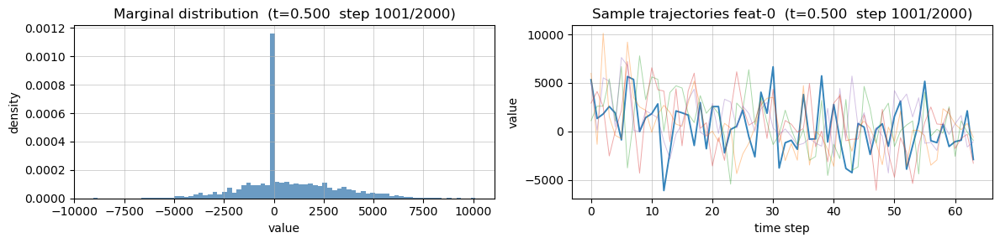

[step 1201/2000 | t=0.4003]  mean=1673.0068  std=5766.9673  min=-22365.4258  max=24971.2812  dx_norm=4.77e-01
  skew=0.3547  kurt(excess)=0.6968
  per-feat std: k0=6808.178  k1=6465.467  k2=6385.551  k3=1.044
  elapsed 10.1s



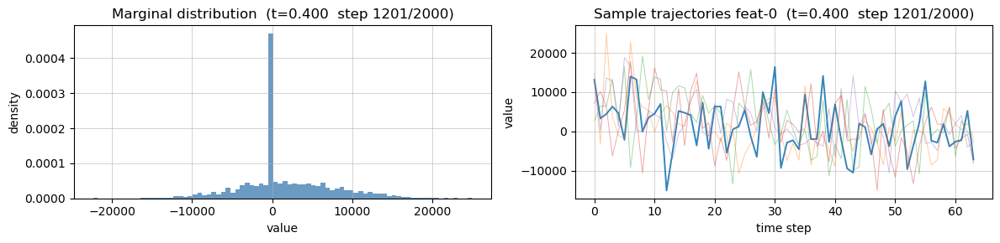

[step 1401/2000 | t=0.3004]  mean=3387.8242  std=11676.1494  min=-45280.9609  max=50556.3867  dx_norm=7.28e-01
  skew=0.3547  kurt(excess)=0.6967
  per-feat std: k0=13784.239  k1=13090.240  k2=12928.494  k3=1.083
  elapsed 10.1s



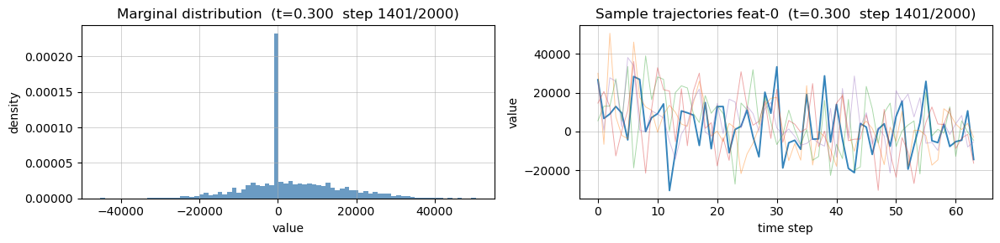

[step 1601/2000 | t=0.2004]  mean=5625.8403  std=19387.8125  min=-75185.2500  max=83945.9453  dx_norm=8.14e-01
  skew=0.3547  kurt(excess)=0.6967
  per-feat std: k0=22888.184  k1=21735.822  k2=21467.191  k3=1.043
  elapsed 10.3s



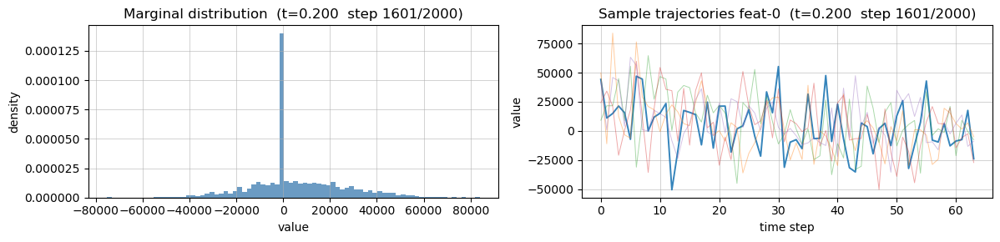

[step 1801/2000 | t=0.1005]  mean=7659.9688  std=26396.9219  min=-102364.9844  max=114291.6953  dx_norm=5.69e-01
  skew=0.3548  kurt(excess)=0.6966
  per-feat std: k0=31162.686  k1=29593.803  k2=29227.986  k3=1.036
  elapsed 10.0s



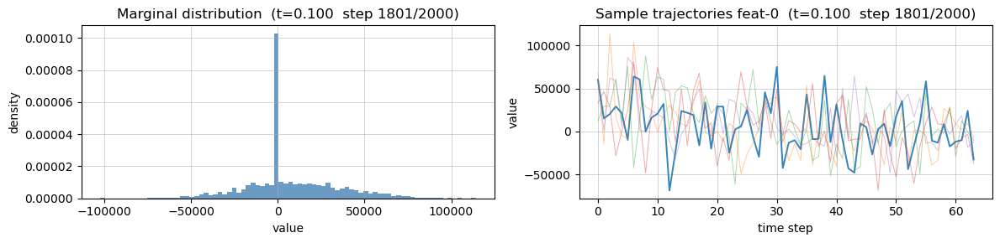

[step 1992/2000 | t=0.0050]  mean=8544.3105  std=29443.7656  min=-114180.1484  max=127483.0312  dx_norm=6.04e-02
  skew=0.3548  kurt(excess)=0.6966
  per-feat std: k0=34759.594  k1=33009.633  k2=32601.541  k3=1.009
  elapsed 9.6s

[step 1993/2000 | t=0.0045]  mean=8545.1211  std=29446.5547  min=-114190.9922  max=127495.1094  dx_norm=5.74e-02
  skew=0.3548  kurt(excess)=0.6966
  per-feat std: k0=34762.887  k1=33012.762  k2=32604.631  k3=1.009
  elapsed 0.1s

[step 1994/2000 | t=0.0040]  mean=8545.8887  std=29449.1992  min=-114201.2578  max=127506.5625  dx_norm=5.44e-02
  skew=0.3548  kurt(excess)=0.6966
  per-feat std: k0=34766.008  k1=33015.723  k2=32607.559  k3=1.009
  elapsed 0.0s

[step 1995/2000 | t=0.0035]  mean=8546.6152  std=29451.6973  min=-114210.9453  max=127517.3906  dx_norm=5.14e-02
  skew=0.3548  kurt(excess)=0.6966
  per-feat std: k0=34768.957  k1=33018.523  k2=32610.324  k3=1.008
  elapsed 0.1s

[step 1996/2000 | t=0.0030]  mean=8547.2988  std=29454.0488  min=-114220.078

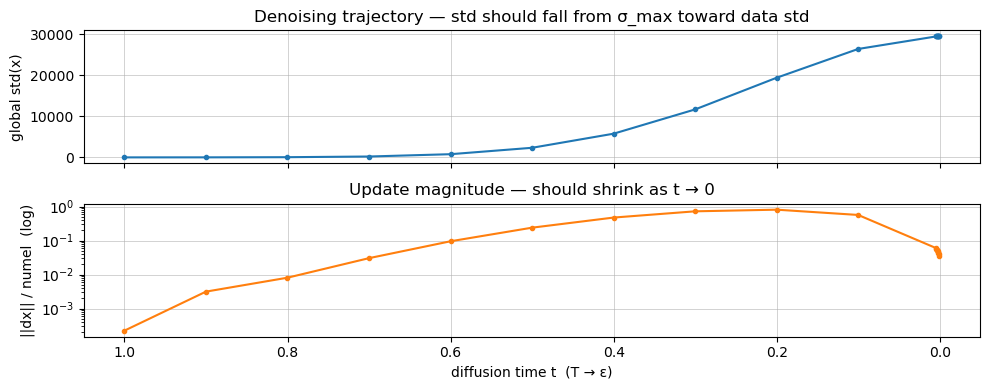

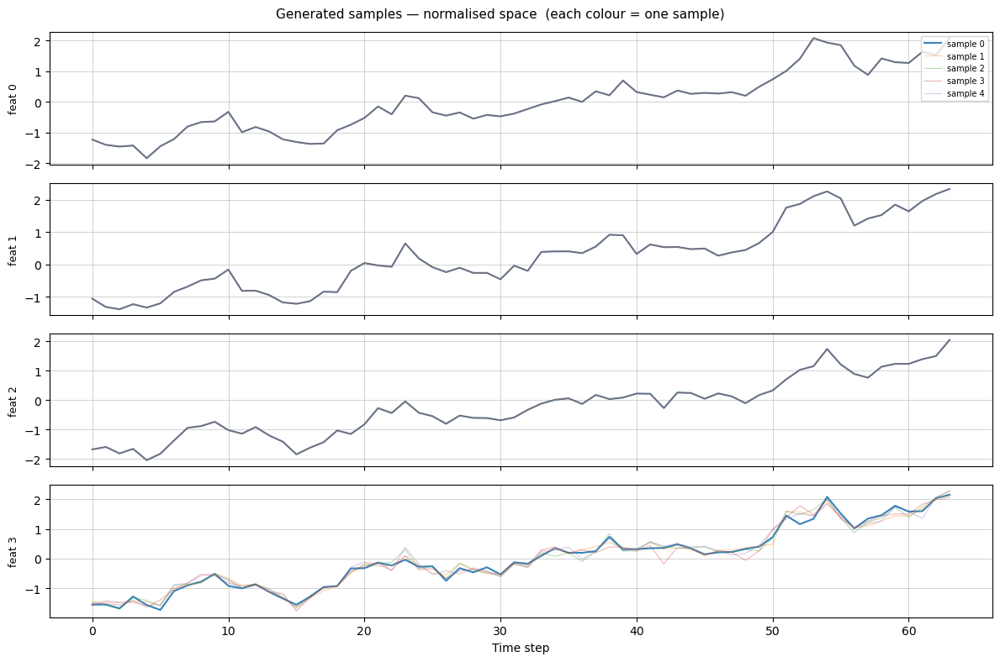

This is our SDE: <src.utils.WIP_SDE.VPSDE object at 0x0000020F8EB96FC0>
This is the value of T: 1.0
Check prior vp: Mean = 0.021161552518606186, Std = 0.9919866323471069
[step    1/2000 | t=1.0000]  mean=0.0244  std=0.9970  min=-3.5749  max=3.4320  dx_norm=2.20e-04
  skew=-0.0533  kurt(excess)=0.1097
  per-feat std: k0=1.018  k1=0.974  k2=1.021  k3=0.973
  elapsed 0.1s



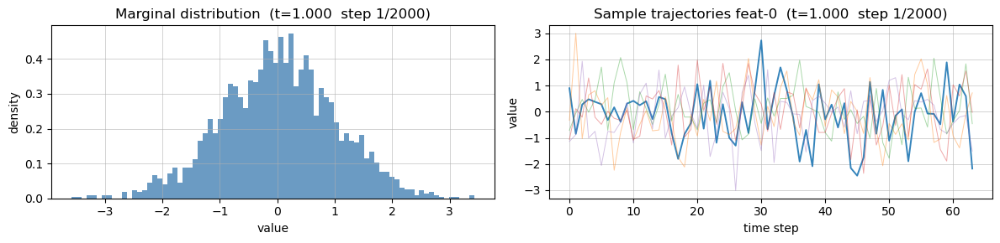

[step  201/2000 | t=0.9001]  mean=1.9827  std=8.4179  min=-32.0418  max=37.3669  dx_norm=3.08e-03
  skew=0.3066  kurt(excess)=0.7943
  per-feat std: k0=9.627  k1=9.487  k2=9.601  k3=1.041
  elapsed 10.1s



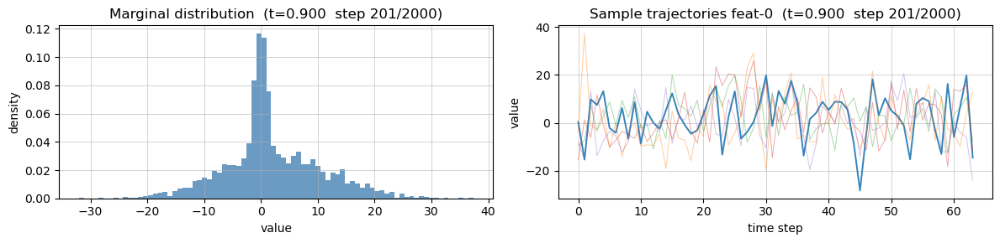

[step  401/2000 | t=0.8001]  mean=12.2888  std=46.2228  min=-170.7449  max=204.6980  dx_norm=7.92e-03
  skew=0.3352  kurt(excess)=0.7707
  per-feat std: k0=52.796  k1=51.972  k2=52.584  k3=1.002
  elapsed 10.0s



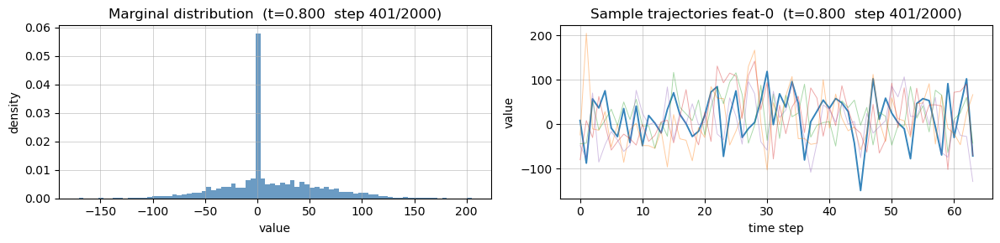

[step  601/2000 | t=0.7002]  mean=56.2176  std=206.7112  min=-769.5238  max=912.7404  dx_norm=2.97e-02
  skew=0.3426  kurt(excess)=0.7741
  per-feat std: k0=236.117  k1=232.166  k2=234.924  k3=0.970
  elapsed 10.1s



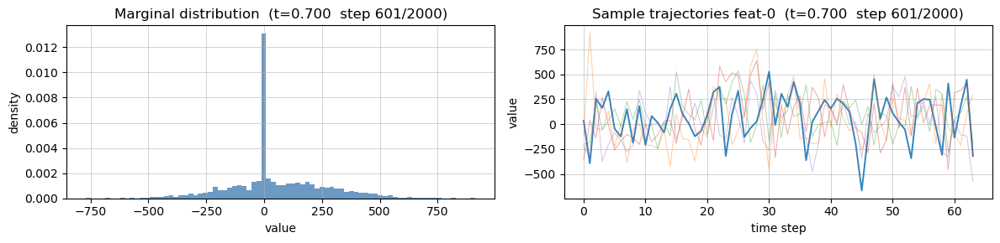

[step  801/2000 | t=0.6002]  mean=207.1624  std=758.0568  min=-2824.9517  max=3346.0479  dx_norm=9.31e-02
  skew=0.3438  kurt(excess)=0.7734
  per-feat std: k0=865.962  k1=851.306  k2=861.139  k3=0.961
  elapsed 10.1s



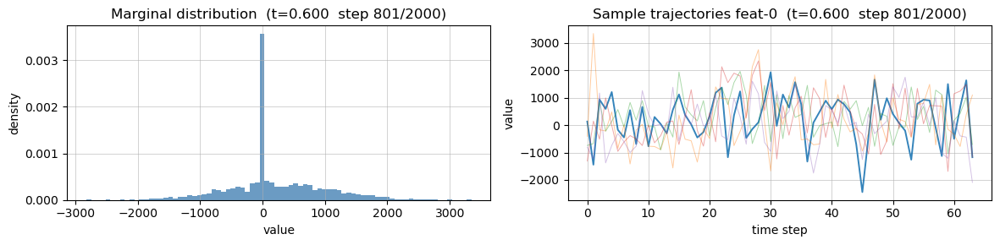

[step 1001/2000 | t=0.5003]  mean=624.1270  std=2280.7227  min=-8493.5127  max=10068.7676  dx_norm=2.34e-01
  skew=0.3442  kurt(excess)=0.7724
  per-feat std: k0=2605.323  k1=2561.101  k2=2590.727  k3=1.015
  elapsed 10.2s



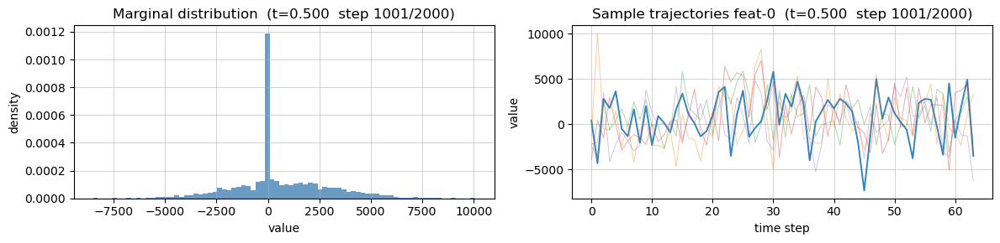

[step 1201/2000 | t=0.4003]  mean=1541.1429  std=5629.3901  min=-20963.6152  max=24852.0430  dx_norm=4.63e-01
  skew=0.3443  kurt(excess)=0.7724
  per-feat std: k0=6430.483  k1=6321.277  k2=6394.535  k3=1.045
  elapsed 10.1s



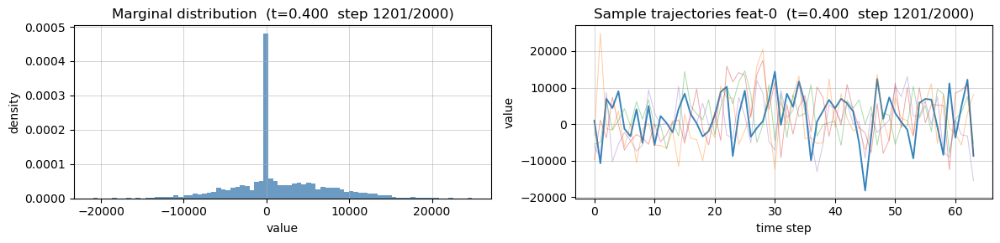

[step 1401/2000 | t=0.3004]  mean=3120.7466  std=11397.6035  min=-42442.0977  max=50318.3477  dx_norm=7.07e-01
  skew=0.3444  kurt(excess)=0.7724
  per-feat std: k0=13019.438  k1=12798.461  k2=12946.671  k3=1.080
  elapsed 10.0s



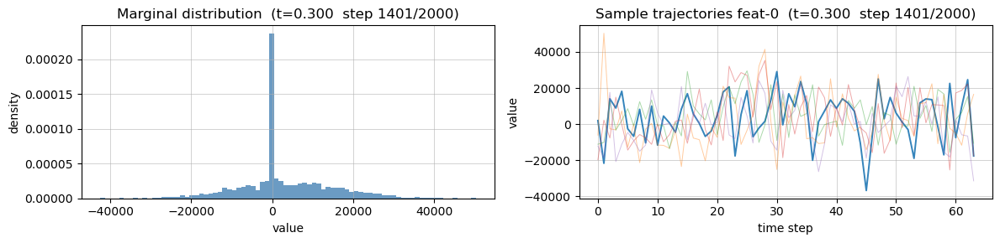

[step 1601/2000 | t=0.2004]  mean=5182.1855  std=18925.3301  min=-70471.2031  max=83552.3203  dx_norm=7.91e-01
  skew=0.3444  kurt(excess)=0.7724
  per-feat std: k0=21618.227  k1=21251.402  k2=21497.484  k3=1.072
  elapsed 10.0s



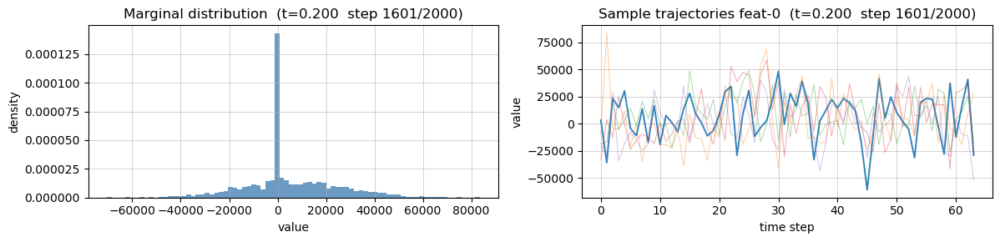

[step 1801/2000 | t=0.1005]  mean=7055.8384  std=25767.2520  min=-95945.7500  max=113758.0625  dx_norm=5.53e-01
  skew=0.3444  kurt(excess)=0.7723
  per-feat std: k0=29433.697  k1=28934.180  k2=29269.234  k3=1.037
  elapsed 10.2s



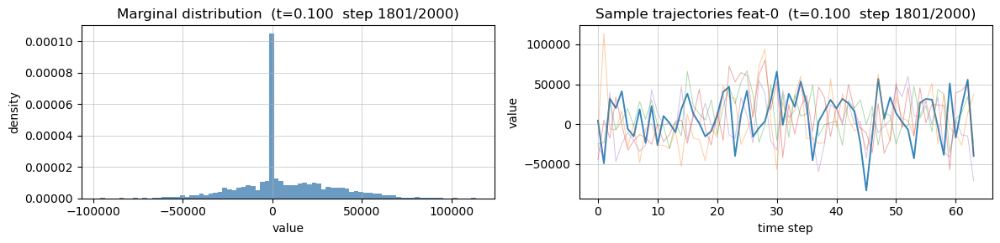

[step 1992/2000 | t=0.0050]  mean=7870.3701  std=28741.4082  min=-107019.0234  max=126887.9688  dx_norm=5.87e-02
  skew=0.3444  kurt(excess)=0.7723
  per-feat std: k0=32831.023  k1=32273.846  k2=32647.582  k3=1.014
  elapsed 9.7s

[step 1993/2000 | t=0.0045]  mean=7871.1172  std=28744.1309  min=-107029.1641  max=126900.0156  dx_norm=5.58e-02
  skew=0.3444  kurt(excess)=0.7723
  per-feat std: k0=32834.133  k1=32276.902  k2=32650.676  k3=1.015
  elapsed 0.0s

[step 1994/2000 | t=0.0040]  mean=7871.8242  std=28746.7129  min=-107038.7578  max=126911.4141  dx_norm=5.29e-02
  skew=0.3444  kurt(excess)=0.7723
  per-feat std: k0=32837.082  k1=32279.799  k2=32653.607  k3=1.014
  elapsed 0.0s

[step 1995/2000 | t=0.0035]  mean=7872.4932  std=28749.1504  min=-107047.8203  max=126922.1641  dx_norm=5.00e-02
  skew=0.3444  kurt(excess)=0.7723
  per-feat std: k0=32839.867  k1=32282.537  k2=32656.377  k3=1.014
  elapsed 0.0s

[step 1996/2000 | t=0.0030]  mean=7873.1221  std=28751.4453  min=-107056.382

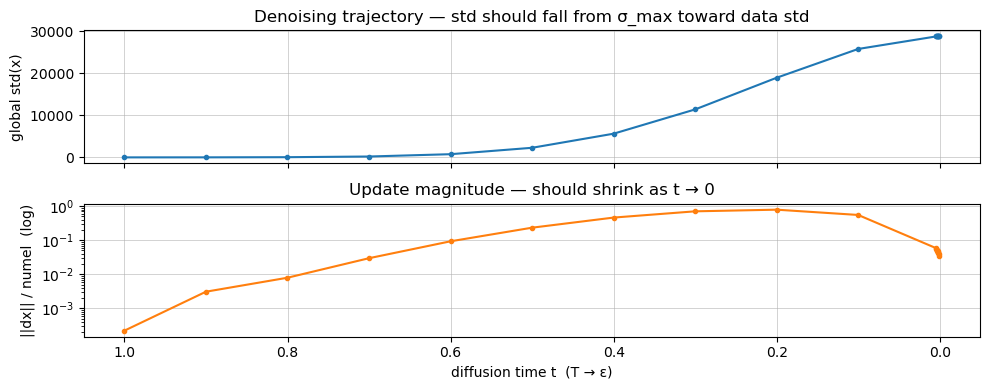

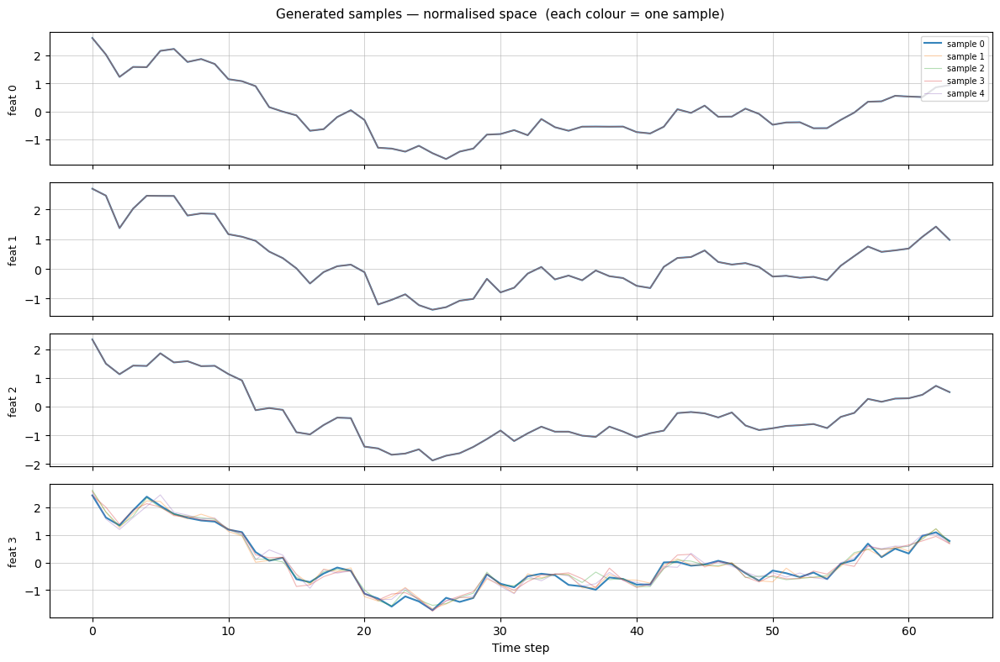

This is our SDE: <src.utils.WIP_SDE.VPSDE object at 0x0000020F8EB96FC0>
This is the value of T: 1.0
Check prior vp: Mean = -0.004833444021642208, Std = 1.0112797021865845
[step    1/2000 | t=1.0000]  mean=-0.0013  std=1.0164  min=-3.4737  max=3.1421  dx_norm=2.27e-04
  skew=-0.0094  kurt(excess)=-0.1461
  per-feat std: k0=1.015  k1=1.008  k2=1.047  k3=0.988
  elapsed 0.1s



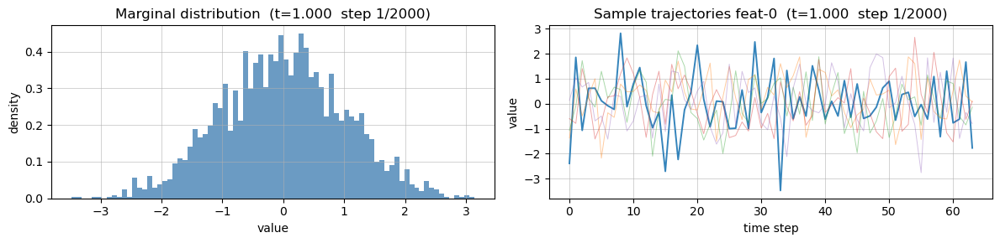

[step  201/2000 | t=0.9001]  mean=2.0177  std=8.3989  min=-28.8010  max=34.1570  dx_norm=3.04e-03
  skew=0.2557  kurt(excess)=0.8742
  per-feat std: k0=9.853  k1=9.019  k2=9.646  k3=1.038
  elapsed 10.1s



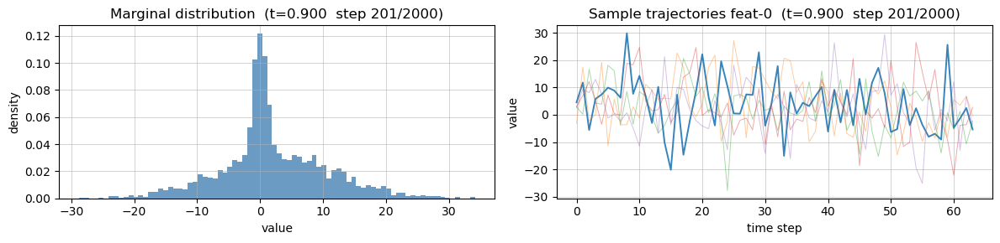

[step  401/2000 | t=0.8001]  mean=12.8115  std=46.1238  min=-155.8875  max=196.6047  dx_norm=8.01e-03
  skew=0.2903  kurt(excess)=0.8945
  per-feat std: k0=54.153  k1=49.391  k2=52.641  k3=1.006
  elapsed 10.1s



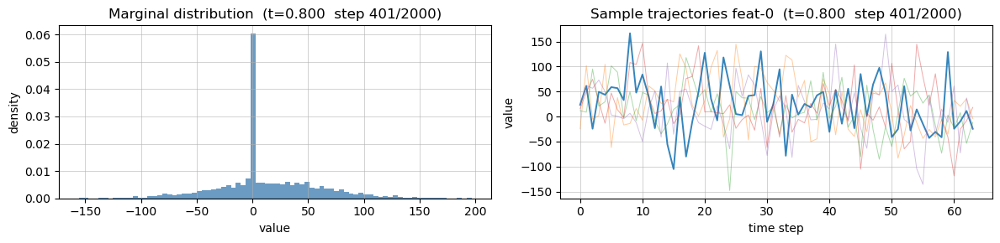

[step  601/2000 | t=0.7002]  mean=58.6846  std=206.4606  min=-697.2390  max=886.1615  dx_norm=2.97e-02
  skew=0.2943  kurt(excess)=0.8988
  per-feat std: k0=242.308  k1=221.088  k2=235.106  k3=0.993
  elapsed 10.2s



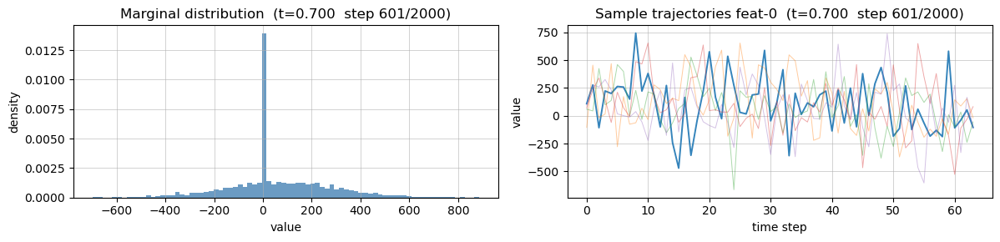

[step  801/2000 | t=0.6002]  mean=216.5443  std=757.2204  min=-2553.7546  max=3251.0078  dx_norm=9.32e-02
  skew=0.2959  kurt(excess)=0.8961
  per-feat std: k0=888.617  k1=810.683  k2=862.014  k3=0.996
  elapsed 10.2s



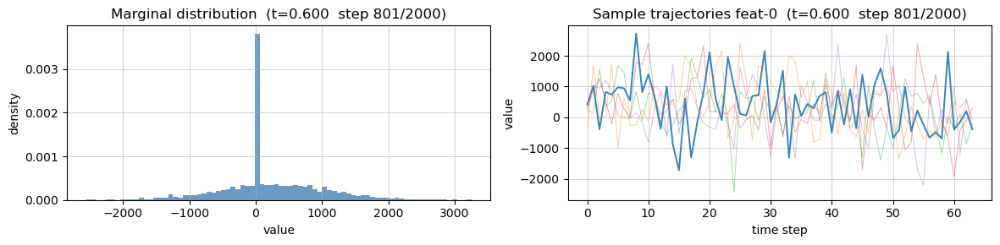

[step 1001/2000 | t=0.5003]  mean=652.3849  std=2278.2144  min=-7681.6343  max=9782.4316  dx_norm=2.34e-01
  skew=0.2962  kurt(excess)=0.8957
  per-feat std: k0=2673.396  k1=2438.948  k2=2593.337  k3=0.941
  elapsed 10.5s



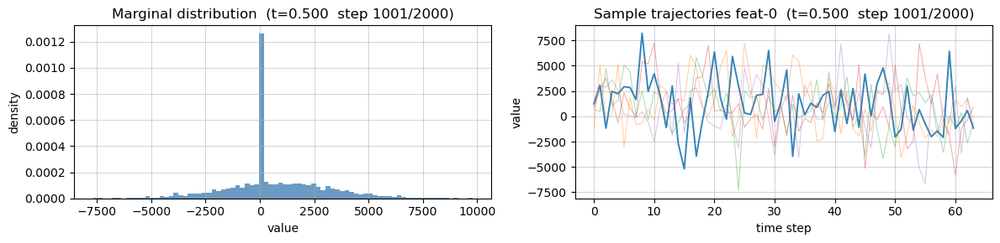

[step 1201/2000 | t=0.4003]  mean=1611.0234  std=5623.2295  min=-18955.3398  max=24147.1523  dx_norm=4.64e-01
  skew=0.2963  kurt(excess)=0.8954
  per-feat std: k0=6598.591  k1=6019.870  k2=6400.875  k3=1.042
  elapsed 10.1s



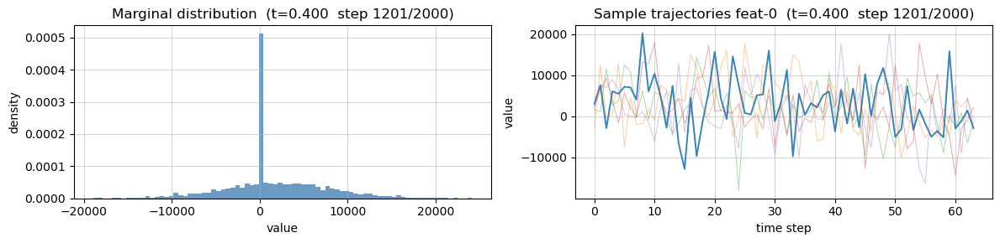

[step 1401/2000 | t=0.3004]  mean=3262.3152  std=11385.1816  min=-38377.6641  max=48888.7617  dx_norm=7.09e-01
  skew=0.2963  kurt(excess)=0.8953
  per-feat std: k0=13360.003  k1=12188.104  k2=12959.510  k3=1.064
  elapsed 10.6s



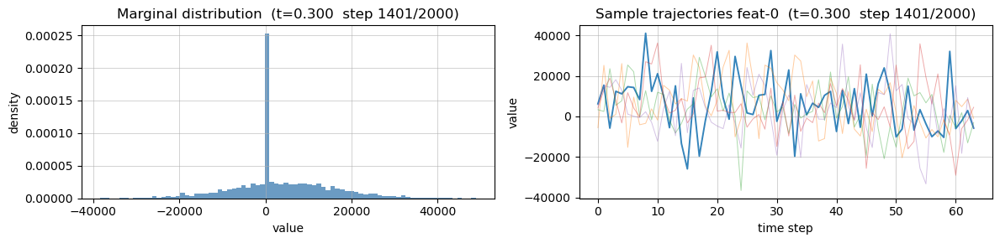

[step 1601/2000 | t=0.2004]  mean=5417.3770  std=18904.6895  min=-63720.4023  max=81180.5078  dx_norm=7.93e-01
  skew=0.2964  kurt(excess)=0.8953
  per-feat std: k0=22183.727  k1=20237.850  k2=21518.729  k3=1.087
  elapsed 10.1s



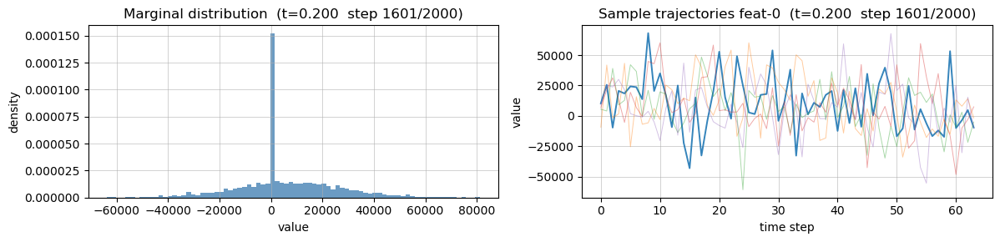

[step 1801/2000 | t=0.1005]  mean=7376.1470  std=25739.1309  min=-86756.2109  max=110529.1953  dx_norm=5.55e-01
  skew=0.2964  kurt(excess)=0.8953
  per-feat std: k0=30203.561  k1=27554.172  k2=29298.166  k3=1.038
  elapsed 10.3s



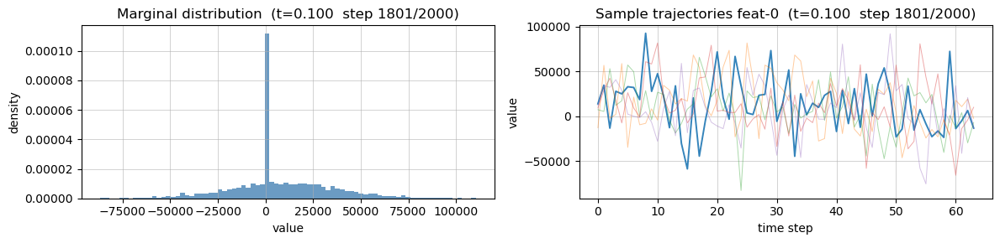

[step 1992/2000 | t=0.0050]  mean=8227.7334  std=28710.0684  min=-96768.9375  max=123288.1562  dx_norm=5.89e-02
  skew=0.2964  kurt(excess)=0.8953
  per-feat std: k0=33689.773  k1=30734.545  k2=32679.896  k3=1.011
  elapsed 9.8s

[step 1993/2000 | t=0.0045]  mean=8228.5127  std=28712.7891  min=-96778.0938  max=123299.8438  dx_norm=5.59e-02
  skew=0.2964  kurt(excess)=0.8953
  per-feat std: k0=33692.965  k1=30737.457  k2=32682.992  k3=1.012
  elapsed 0.1s

[step 1994/2000 | t=0.0040]  mean=8229.2529  std=28715.3652  min=-96786.7812  max=123310.9141  dx_norm=5.30e-02
  skew=0.2964  kurt(excess)=0.8953
  per-feat std: k0=33695.988  k1=30740.217  k2=32685.926  k3=1.012
  elapsed 0.1s

[step 1995/2000 | t=0.0035]  mean=8229.9512  std=28717.8008  min=-96794.9766  max=123321.3750  dx_norm=5.01e-02
  skew=0.2964  kurt(excess)=0.8953
  per-feat std: k0=33698.848  k1=30742.824  k2=32688.697  k3=1.012
  elapsed 0.1s

[step 1996/2000 | t=0.0030]  mean=8230.6084  std=28720.0938  min=-96802.7266  ma

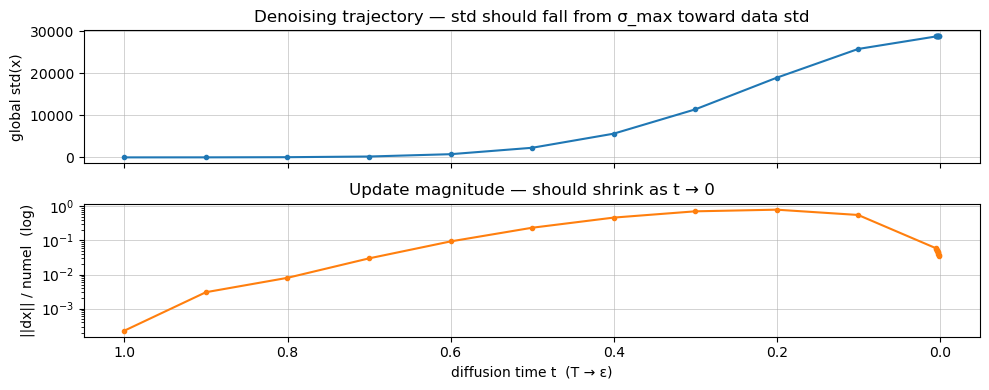

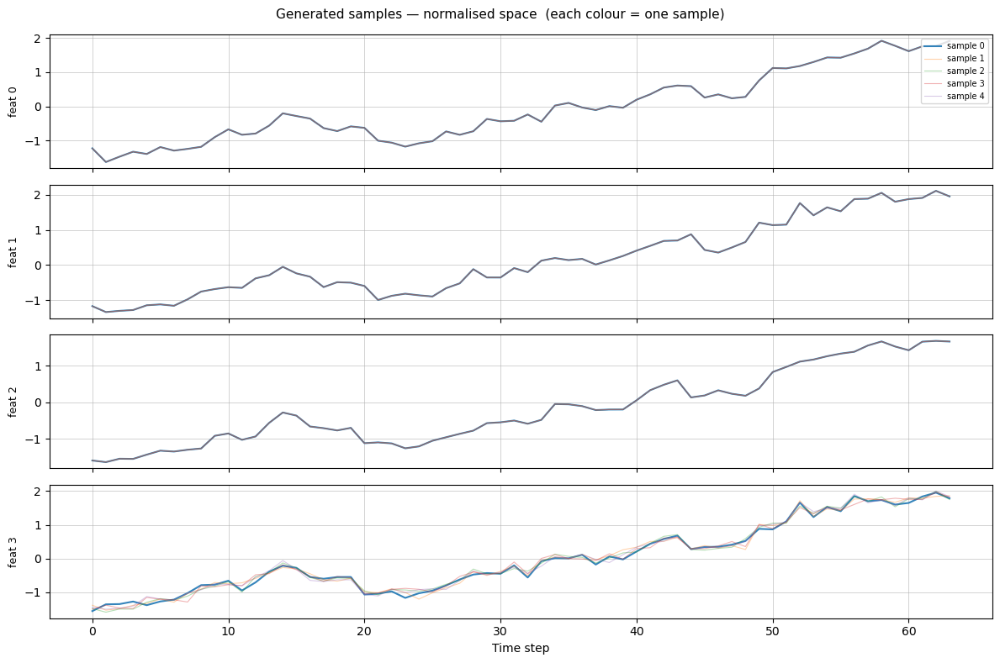

This is our SDE: <src.utils.WIP_SDE.VPSDE object at 0x0000020F8EB96FC0>
This is the value of T: 1.0
Check prior vp: Mean = 0.0006377279642038047, Std = 1.006664514541626
[step    1/2000 | t=1.0000]  mean=0.0037  std=1.0111  min=-4.1345  max=3.0888  dx_norm=2.21e-04
  skew=-0.0446  kurt(excess)=0.0871
  per-feat std: k0=1.000  k1=1.010  k2=0.986  k3=1.049
  elapsed 0.1s



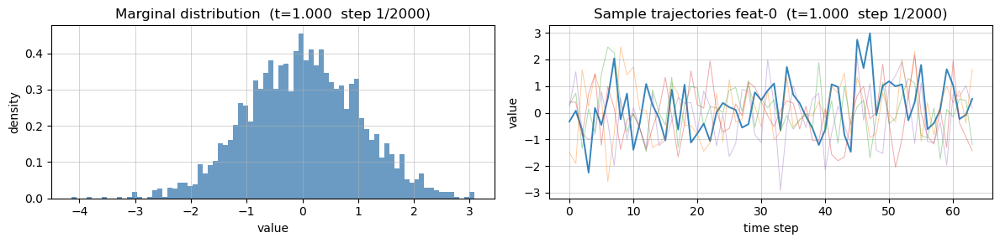

[step  201/2000 | t=0.9001]  mean=2.0177  std=8.3132  min=-29.4036  max=38.5834  dx_norm=3.08e-03
  skew=0.2769  kurt(excess)=0.8894
  per-feat std: k0=9.602  k1=9.751  k2=9.061  k3=0.964
  elapsed 10.5s



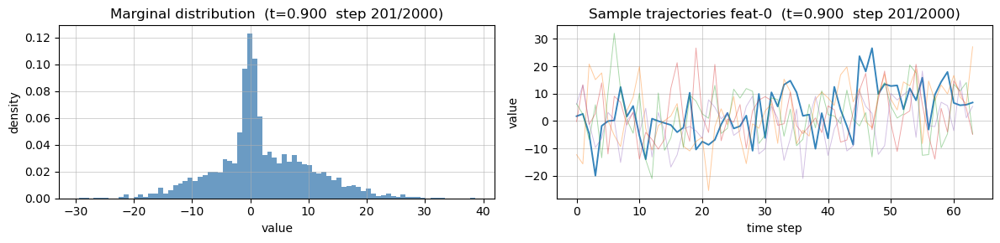

[step  401/2000 | t=0.8001]  mean=12.6069  std=45.6820  min=-158.5188  max=208.4150  dx_norm=7.84e-03
  skew=0.3105  kurt(excess)=0.8960
  per-feat std: k0=52.848  k1=53.644  k2=49.327  k3=1.030
  elapsed 10.2s



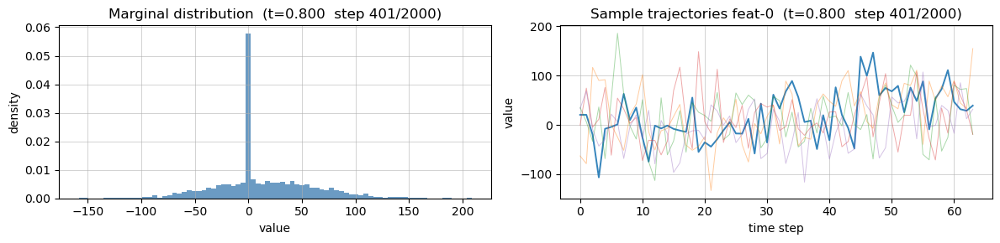

[step  601/2000 | t=0.7002]  mean=57.4749  std=204.4061  min=-706.3978  max=929.3973  dx_norm=2.94e-02
  skew=0.3179  kurt(excess)=0.8917
  per-feat std: k0=236.495  k1=239.761  k2=220.608  k3=1.001
  elapsed 10.4s



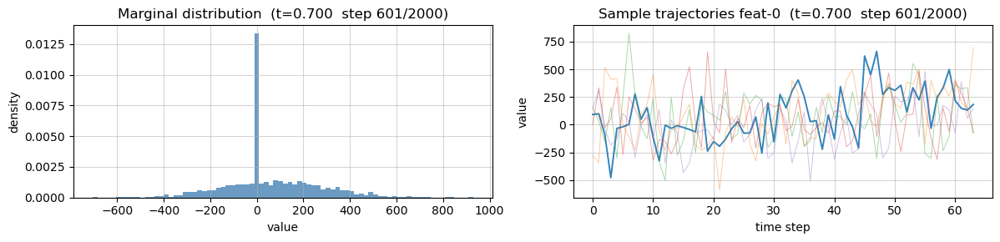

[step  801/2000 | t=0.6002]  mean=211.6608  std=749.4919  min=-2590.3472  max=3407.4949  dx_norm=9.23e-02
  skew=0.3184  kurt(excess)=0.8896
  per-feat std: k0=867.264  k1=878.860  k2=808.683  k3=1.057
  elapsed 10.2s



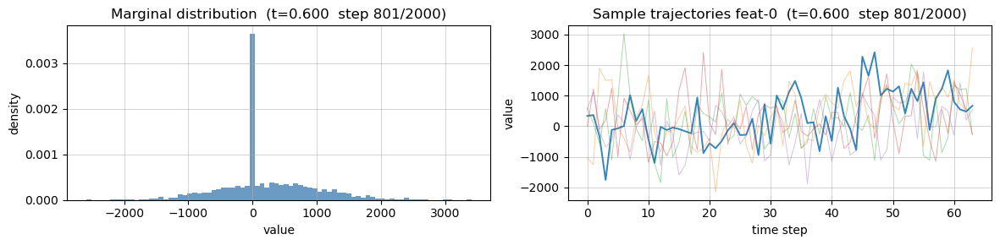

[step 1001/2000 | t=0.5003]  mean=637.6542  std=2254.9631  min=-7793.0776  max=10248.8867  dx_norm=2.32e-01
  skew=0.3187  kurt(excess)=0.8892
  per-feat std: k0=2609.315  k1=2643.921  k2=2432.931  k3=1.054
  elapsed 10.3s



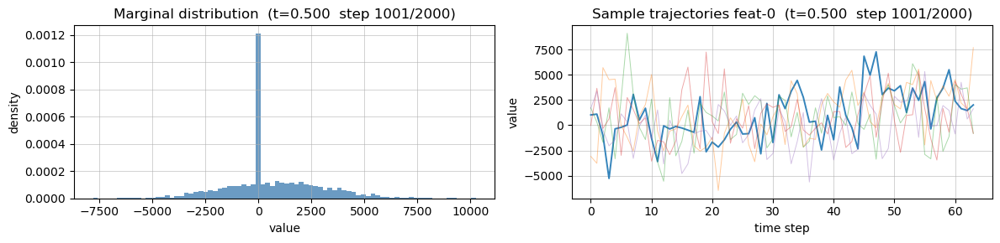

[step 1201/2000 | t=0.4003]  mean=1574.6243  std=5565.8882  min=-19235.5527  max=25299.1797  dx_norm=4.59e-01
  skew=0.3188  kurt(excess)=0.8890
  per-feat std: k0=6440.527  k1=6525.774  k2=6005.084  k3=1.050
  elapsed 11.0s



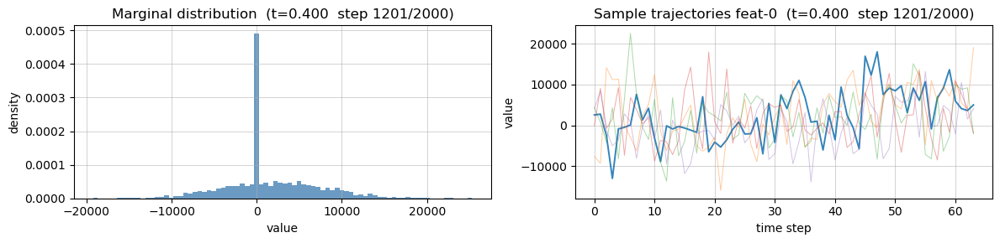

[step 1401/2000 | t=0.3004]  mean=3188.6177  std=11269.0283  min=-38943.3242  max=51224.5742  dx_norm=7.01e-01
  skew=0.3189  kurt(excess)=0.8890
  per-feat std: k0=13039.879  k1=13212.338  k2=12158.164  k3=1.072
  elapsed 10.4s



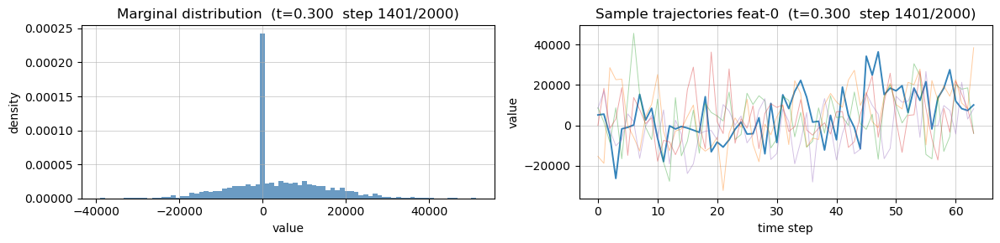

[step 1601/2000 | t=0.2004]  mean=5295.0249  std=18711.8438  min=-64663.5977  max=85058.0000  dx_norm=7.84e-01
  skew=0.3189  kurt(excess)=0.8890
  per-feat std: k0=21652.322  k1=21938.533  k2=20188.131  k3=1.090
  elapsed 10.2s



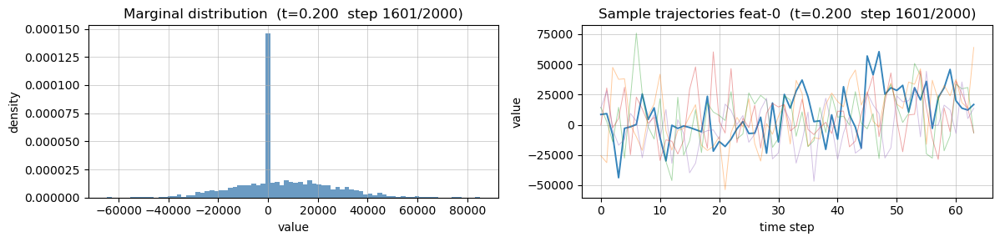

[step 1801/2000 | t=0.1005]  mean=7209.5171  std=25476.5527  min=-88038.7969  max=115808.3672  dx_norm=5.49e-01
  skew=0.3189  kurt(excess)=0.8889
  per-feat std: k0=29480.072  k1=29869.623  k2=27486.578  k3=1.025
  elapsed 10.3s



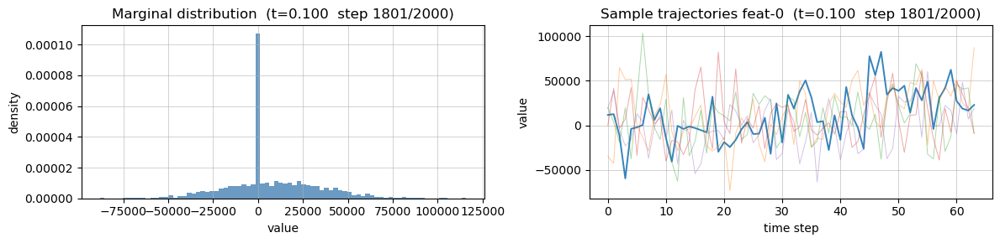

In [ ]:
n_windows  = len(train_indices)
all_gen_close = []   # will be (n_windows * N_SAMPLES_PER_WINDOW, seq_len)
all_gt_close  = []   # repeated to match generated shape for easy comparison

with torch.no_grad():
    for w_idx in range(n_windows):
        # observed_data: (B, K, seq_len) — same OHL context repeated N times
        obs = torch.from_numpy(gt_windows[w_idx]).unsqueeze(0)          # (1, K, seq_len)
        obs = obs.expand(N_SAMPLES_PER_WINDOW, -1, -1).to(device)       # (B, K, seq_len)

        # cond_mask: 1 for O/H/L, 0 for Close — matches get_predict_close_mask logic
        cond_mask = torch.ones(N_SAMPLES_PER_WINDOW, K, seq_len, device=device)
        cond_mask[:, CLOSE_IDX, :] = 0.0

        # observed_tp: normalised time positions [0, 1]
        observed_tp = torch.linspace(0.0, 1.0, seq_len, device=device)\
                          .unsqueeze(0).expand(N_SAMPLES_PER_WINDOW, -1)

        samples = processes.reverse_process(
            model         = model,
            shape         = (N_SAMPLES_PER_WINDOW, K, seq_len),
            observed_data = obs,
            cond_mask     = cond_mask,
            observed_tp   = observed_tp,
            num_steps     = N_STEPS,
            device        = device,
        )  # (B, K, seq_len)

        gen_close = samples[:, CLOSE_IDX, :].cpu().numpy()   # (B, seq_len)
        all_gen_close.append(gen_close)
        all_gt_close.append(
            np.tile(gt_close[w_idx], (N_SAMPLES_PER_WINDOW, 1))   # (B, seq_len)
        )

all_gen_close = np.concatenate(all_gen_close, axis=0)   # (n_windows*B, seq_len)
all_gt_close  = np.concatenate(all_gt_close,  axis=0)

# Also keep OHL repeated for constraint checks
all_gt_high = np.repeat(gt_high, N_SAMPLES_PER_WINDOW, axis=0)
all_gt_low  = np.repeat(gt_low,  N_SAMPLES_PER_WINDOW, axis=0)

print(f"Generated Close shape : {all_gen_close.shape}")
print(f"GT Close shape        : {all_gt_close.shape}")

## 5. Sample path overlays

Visual comparison of ground-truth vs generated Close paths for each training window.

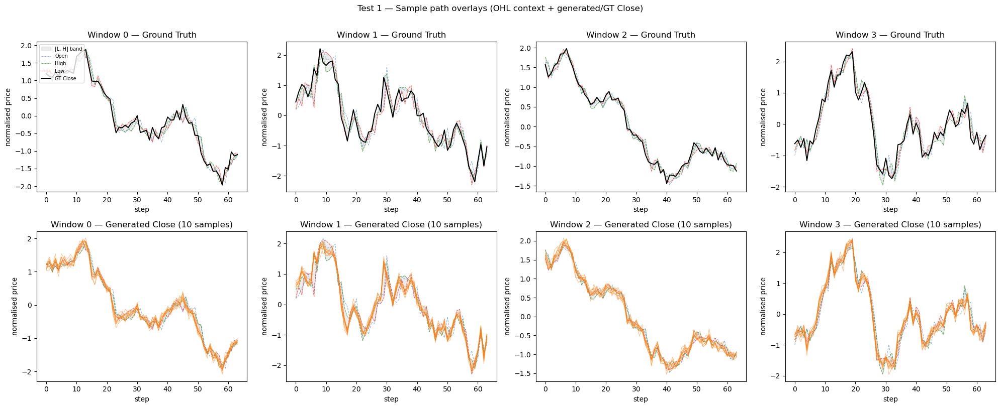

In [ ]:
steps   = np.arange(seq_len)
n_cols  = min(n_windows, 4)
n_rows  = 2   # row 0: GT context + GT close; row 1: GT context + generated close

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows), sharey=False)
if n_cols == 1:
    axes = axes.reshape(n_rows, 1)

for col, w in enumerate(range(n_cols)):
    # GT OHL shading
    for ax in axes[:, col]:
        ax.fill_between(steps, gt_low[w], gt_high[w],
                        alpha=0.15, color="gray", label="[L, H] band")
        ax.plot(steps, gt_open[w],  color="steelblue",  lw=0.8, ls="--", alpha=0.6, label="Open")
        ax.plot(steps, gt_high[w],  color="green",      lw=0.8, ls="--", alpha=0.6, label="High")
        ax.plot(steps, gt_low[w],   color="red",        lw=0.8, ls="--", alpha=0.6, label="Low")

    # Top row: ground-truth Close
    axes[0, col].plot(steps, gt_close[w], color="black", lw=1.4, label="GT Close")
    axes[0, col].set_title(f"Window {w} — Ground Truth")

    # Bottom row: all generated Close samples for this window
    for s in range(N_SAMPLES_PER_WINDOW):
        gen = all_gen_close[w * N_SAMPLES_PER_WINDOW + s]
        axes[1, col].plot(steps, gen, color="tab:orange", lw=0.7, alpha=0.5)
    axes[1, col].set_title(f"Window {w} — Generated Close ({N_SAMPLES_PER_WINDOW} samples)")

axes[0, 0].legend(fontsize=7, loc="upper left")
for ax in axes.ravel():
    ax.set_xlabel("step")
    ax.set_ylabel("normalised price")

plt.suptitle("Test 1 — Sample path overlays (OHL context + generated/GT Close)", y=1.01)
plt.tight_layout()
plt.show()

## 6. OHLC constraint satisfaction

The fundamental structural test: does the generated Close satisfy `L ≤ Close ≤ H`?
A perfectly conditioned model that has memorised the training data should satisfy
this at a very high rate on the training windows.

**We normalize data at a column level, therefore this condition can be broken at a local level if data is normalized**

  OHLC CONSTRAINT  L ≤ Close ≤ H
  Step-wise satisfaction rate : 0.1534  (fraction of steps inside [L,H])
  Fully valid samples         : 0.0000  (all steps inside [L,H])
  At least 1 step valid       : 1.0000


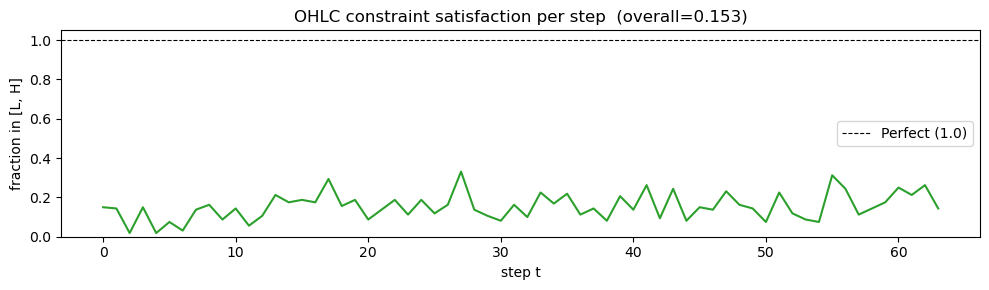

In [ ]:
above_low  = (all_gen_close >= all_gt_low)    # (N, seq_len)
below_high = (all_gen_close <= all_gt_high)
in_band    = above_low & below_high

# Per time-step satisfaction rate
step_rate = in_band.mean(axis=0)   # (seq_len,)

# Overall: a sample is "fully valid" if all seq_len steps are inside [L, H]
fully_valid = in_band.all(axis=1).mean()
any_valid   = in_band.any(axis=1).mean()
stepwise    = in_band.mean()

print("=" * 55)
print("  OHLC CONSTRAINT  L ≤ Close ≤ H")
print("=" * 55)
print(f"  Step-wise satisfaction rate : {stepwise:.4f}  (fraction of steps inside [L,H])")
print(f"  Fully valid samples         : {fully_valid:.4f}  (all steps inside [L,H])")
print(f"  At least 1 step valid       : {any_valid:.4f}")

fig, ax = plt.subplots(figsize=(10, 3))
ax.plot(np.arange(seq_len), step_rate, color="tab:green", lw=1.5)
ax.axhline(1.0, color="black", lw=0.8, ls="--", label="Perfect (1.0)")
ax.set_ylim(0, 1.05)
ax.set_xlabel("step t")
ax.set_ylabel("fraction in [L, H]")
ax.set_title(f"OHLC constraint satisfaction per step  (overall={stepwise:.3f})")
ax.legend()
plt.tight_layout()
plt.show()

## 7. Marginal distribution of Close values

KS statistic = 0.0124  |  p-value = 4.0702e-01



,mean,std,skewness,excess_kurtosis,q01,q99
label,,,,,,
Generated Close,-0.0022,1.01182,0.21568,-0.82177,-1.98432,2.10380
Ground-truth Close,-0.0000,1.00000,0.20846,-0.79079,-1.96618,2.06348


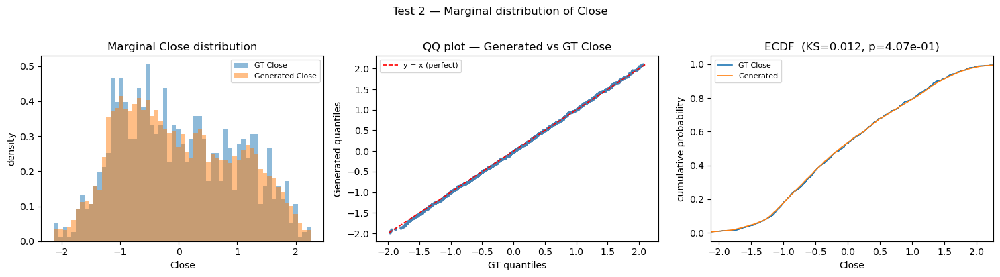

In [ ]:
gen_flat = all_gen_close.ravel()
gt_flat  = all_gt_close.ravel()

ks_stat, ks_p = scipy_stats.ks_2samp(gen_flat, gt_flat)

def moments(x, label):
    return {
        "label"           : label,
        "mean"            : np.mean(x),
        "std"             : np.std(x),
        "skewness"        : scipy_stats.skew(x),
        "excess_kurtosis" : scipy_stats.kurtosis(x, fisher=True),
        "q01"             : np.quantile(x, 0.01),
        "q99"             : np.quantile(x, 0.99),
    }

df_moments = pd.DataFrame([
    moments(gen_flat, "Generated Close"),
    moments(gt_flat,  "Ground-truth Close"),
]).set_index("label").round(5)

print(f"KS statistic = {ks_stat:.4f}  |  p-value = {ks_p:.4e}")
print()
display(df_moments)

combined = np.concatenate([gen_flat, gt_flat])
lo, hi   = np.quantile(combined, [0.005, 0.995])
bins     = np.linspace(lo, hi, 60)
probs    = np.linspace(0.01, 0.99, min(len(gen_flat), 5_000))

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# Histogram
ax = axes[0]
ax.hist(gt_flat,  bins=bins, density=True, alpha=0.5, label="GT Close",        color="tab:blue")
ax.hist(gen_flat, bins=bins, density=True, alpha=0.5, label="Generated Close", color="tab:orange")
ax.set_title("Marginal Close distribution")
ax.set_xlabel("Close"); ax.set_ylabel("density"); ax.legend(fontsize=8)

# QQ
ax = axes[1]
q_gt  = np.quantile(gt_flat,  probs)
q_gen = np.quantile(gen_flat, probs)
ax.scatter(q_gt, q_gen, s=4, alpha=0.5, color="steelblue")
lims = [min(q_gt.min(), q_gen.min()), max(q_gt.max(), q_gen.max())]
ax.plot(lims, lims, "r--", lw=1.2, label="y = x (perfect)")
ax.set_title("QQ plot — Generated vs GT Close")
ax.set_xlabel("GT quantiles"); ax.set_ylabel("Generated quantiles"); ax.legend(fontsize=8)

# ECDF
ax = axes[2]
for vals, label, color in [(gt_flat, "GT Close", "tab:blue"), (gen_flat, "Generated", "tab:orange")]:
    s = np.sort(vals)
    ax.plot(s, np.arange(1, len(s) + 1) / len(s), label=label, lw=1.2)
ax.set_xlim(lo, hi)
ax.set_title(f"ECDF  (KS={ks_stat:.3f}, p={ks_p:.2e})")
ax.set_xlabel("Close"); ax.set_ylabel("cumulative probability"); ax.legend(fontsize=8)

plt.suptitle("Test 2 — Marginal distribution of Close", y=1.02)
plt.tight_layout()
plt.show()

## 8. Close increments distribution and ACF

Checks whether the temporal dynamics of Close are reproduced, not just its marginal.

Increment KS = 0.0225  p = 1.1864e-02



,mean,std,skewness,excess_kurtosis,q01,q99
label,,,,,,
Generated ΔClose,0.00025,0.37517,0.14643,1.24325,-0.93887,1.03681
GT ΔClose,-0.00040,0.37776,0.07372,1.27339,-0.98947,1.00978


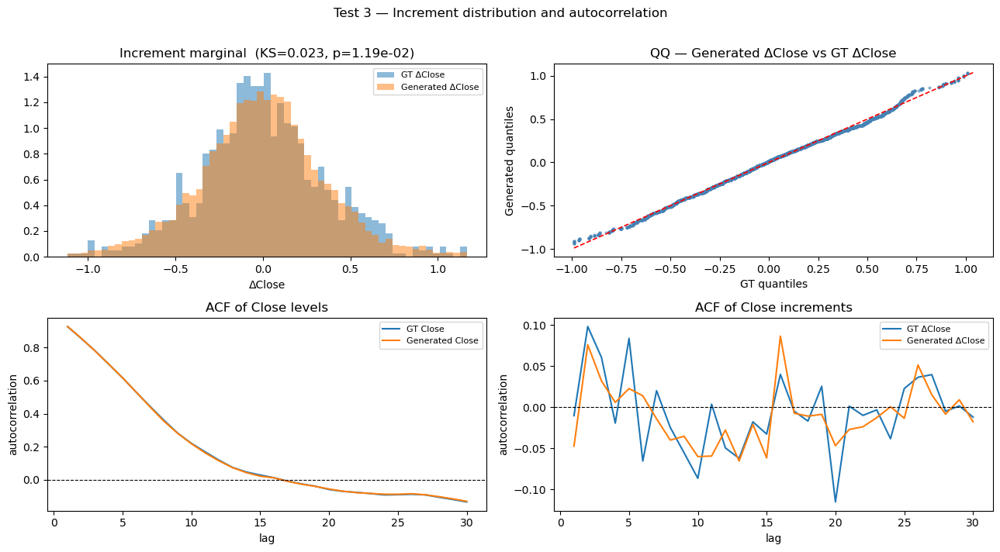

In [ ]:
gen_inc = np.diff(all_gen_close, axis=1).ravel()
gt_inc  = np.diff(all_gt_close,  axis=1).ravel()

ks_inc, ks_p_inc = scipy_stats.ks_2samp(gen_inc, gt_inc)
print(f"Increment KS = {ks_inc:.4f}  p = {ks_p_inc:.4e}")
print()

df_inc = pd.DataFrame([
    moments(gen_inc, "Generated ΔClose"),
    moments(gt_inc,  "GT ΔClose"),
]).set_index("label").round(5)
display(df_inc)

# ACF of Close levels and increments
N_ACF = min(50, len(all_gen_close))
LAGS  = min(30, seq_len // 2)
lag_axis = np.arange(1, LAGS + 1)

def mean_acf(paths, lags, use_diff=False):
    acfs = []
    for p in paths[:N_ACF]:
        x = np.diff(p) if use_diff else p
        acfs.append(acf(x, nlags=lags, fft=True)[1:])
    return np.mean(acfs, axis=0)

fig, axes = plt.subplots(2, 2, figsize=(13, 7))

# Increment histogram
lo_i, hi_i = np.quantile(np.concatenate([gen_inc, gt_inc]), [0.005, 0.995])
bins_i = np.linspace(lo_i, hi_i, 60)
axes[0, 0].hist(gt_inc,  bins=bins_i, density=True, alpha=0.5, label="GT ΔClose",        color="tab:blue")
axes[0, 0].hist(gen_inc, bins=bins_i, density=True, alpha=0.5, label="Generated ΔClose", color="tab:orange")
axes[0, 0].set_title(f"Increment marginal  (KS={ks_inc:.3f}, p={ks_p_inc:.2e})")
axes[0, 0].set_xlabel("ΔClose"); axes[0, 0].legend(fontsize=8)

# Increment QQ
probs_i = np.linspace(0.01, 0.99, min(len(gen_inc), 5_000))
q_gt_i  = np.quantile(gt_inc,  probs_i)
q_gen_i = np.quantile(gen_inc, probs_i)
axes[0, 1].scatter(q_gt_i, q_gen_i, s=4, alpha=0.5, color="steelblue")
lims_i = [min(q_gt_i.min(), q_gen_i.min()), max(q_gt_i.max(), q_gen_i.max())]
axes[0, 1].plot(lims_i, lims_i, "r--", lw=1.2)
axes[0, 1].set_title("QQ — Generated ΔClose vs GT ΔClose")
axes[0, 1].set_xlabel("GT quantiles"); axes[0, 1].set_ylabel("Generated quantiles")

# ACF of levels
axes[1, 0].plot(lag_axis, mean_acf(all_gt_close,  LAGS, use_diff=False), label="GT Close",        color="tab:blue")
axes[1, 0].plot(lag_axis, mean_acf(all_gen_close, LAGS, use_diff=False), label="Generated Close", color="tab:orange")
axes[1, 0].axhline(0, color="black", lw=0.8, ls="--")
axes[1, 0].set_title("ACF of Close levels")
axes[1, 0].set_xlabel("lag"); axes[1, 0].set_ylabel("autocorrelation"); axes[1, 0].legend(fontsize=8)

# ACF of increments
axes[1, 1].plot(lag_axis, mean_acf(all_gt_close,  LAGS, use_diff=True), label="GT ΔClose",        color="tab:blue")
axes[1, 1].plot(lag_axis, mean_acf(all_gen_close, LAGS, use_diff=True), label="Generated ΔClose", color="tab:orange")
axes[1, 1].axhline(0, color="black", lw=0.8, ls="--")
axes[1, 1].set_title("ACF of Close increments")
axes[1, 1].set_xlabel("lag"); axes[1, 1].set_ylabel("autocorrelation"); axes[1, 1].legend(fontsize=8)

plt.suptitle("Test 3 — Increment distribution and autocorrelation", y=1.01)
plt.tight_layout()
plt.show()

## 9. Per-step conditional mean and std

At each timestep t, checks whether the model's conditional distribution
`p(Close_t | O_t, H_t, L_t)` has the right mean and spread.
For an overfit model these should closely track the GT value (mean) with
a small std (low residual uncertainty).

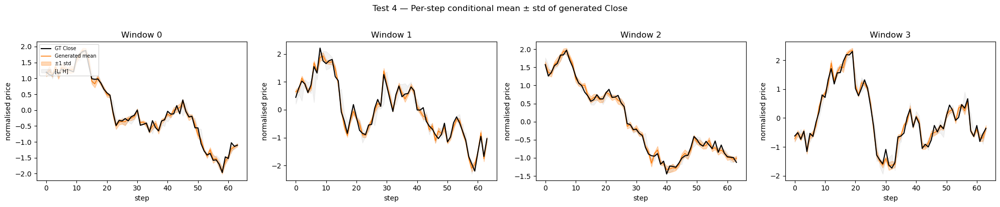

Mean absolute error  (generated mean vs GT): 0.08905
RMSE                 (generated mean vs GT): 0.12003
Mean generated std   (residual uncertainty): 0.08579


In [ ]:
# Reshape to (n_windows, N_SAMPLES_PER_WINDOW, seq_len)
n_wins = n_windows
gen_3d = all_gen_close.reshape(n_wins, N_SAMPLES_PER_WINDOW, seq_len)

# Per-window, per-step mean and std of generated samples
gen_mean = gen_3d.mean(axis=1)   # (n_wins, seq_len)
gen_std  = gen_3d.std(axis=1)    # (n_wins, seq_len)

fig, axes = plt.subplots(1, min(n_wins, 4), figsize=(5 * min(n_wins, 4), 4), sharey=False)
if min(n_wins, 4) == 1:
    axes = [axes]

for col, w in enumerate(range(min(n_wins, 4))):
    ax = axes[col]
    ax.plot(steps, gt_close[w], color="black",      lw=1.5, label="GT Close",        zorder=3)
    ax.plot(steps, gen_mean[w], color="tab:orange", lw=1.2, label="Generated mean",  zorder=2)
    ax.fill_between(
        steps,
        gen_mean[w] - gen_std[w],
        gen_mean[w] + gen_std[w],
        alpha=0.3, color="tab:orange", label="±1 std"
    )
    ax.fill_between(steps, gt_low[w], gt_high[w], alpha=0.10, color="gray", label="[L, H]")
    ax.set_title(f"Window {w}")
    ax.set_xlabel("step")
    ax.set_ylabel("normalised price")

axes[0].legend(fontsize=7, loc="upper left")
plt.suptitle("Test 4 — Per-step conditional mean ± std of generated Close", y=1.02)
plt.tight_layout()
plt.show()

# Summary numbers
mae  = np.abs(gen_mean - gt_close).mean()
rmse = np.sqrt(((gen_mean - gt_close) ** 2).mean())
print(f"Mean absolute error  (generated mean vs GT): {mae:.5f}")
print(f"RMSE                 (generated mean vs GT): {rmse:.5f}")
print(f"Mean generated std   (residual uncertainty): {gen_std.mean():.5f}")

# 10. FTS Metrics (tail distribution, volatility clustering, and leverage effect)

In [ ]:
import sys
sys.path.insert(0, "..")
import replication.stylized_facts as sf
from pathlib import Path

output_dir = Path("../images/stylized_facts_ohlc_conditional")
output_dir.mkdir(exist_ok=True, parents=True)


## 10. Interpretation guide

| Test | Passing (overfit succeeded) | Failing |
|------|----------------------------|---------|
| **Sample paths** (§5) | Generated Close tracks GT closely inside [L, H] | Paths wander outside [L, H] or are uncorrelated with GT |
| **OHLC constraint** (§6) | Step-wise rate > 0.90; many fully-valid samples | Rate < 0.5 → model ignores OHL context |
| **Marginal KS** (§7) | KS p > 0.05; QQ on diagonal | S-curve in QQ (wrong tail shape) |
| **Increment KS** (§8) | KS p > 0.05; similar std | Generated std much larger → noise not denoised |
| **Level ACF** (§8) | Generated ACF tracks GT ACF shape | Flat or decaying faster → wrong temporal structure |
| **Increment ACF** (§8) | Both near 0 at all lags | Positive autocorrelation → spurious momentum |
| **Per-step mean** (§9) | MAE near 0; small residual std | Large MAE → model did not memorise; large std → too uncertain |